In [1]:
import gzip
import os
import pathlib
import tempfile
from concurrent.futures import ThreadPoolExecutor, as_completed
from io import StringIO, BytesIO

import earthaccess
import geopandas as gpd
import holoviews as hv
import hvplot.pandas
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import shapely
import requests
import rioxarray as rxr
import xarray as xr
from tqdm.notebook import tqdm
import utilities as util
import glob
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import h5netcdf
import contextily as cx
import hvplot.xarray
import zipfile
import importlib
import download as dwld

importlib.reload(dwld)

data_dir = pathlib.Path().cwd().parent / 'data'
swot_path = data_dir / 'usgs_swot_data' / 'swot_timeseries_for_usgs_nodes.csv'
mrms_path_flag = data_dir / 'usgs_mrms_data' 
usgs_path = data_dir / 'usgs_stage_data'
start_time = '2023-06-01T00:00:00Z'
end_time = '2024-02-01T00:00:00Z'
precip_dir =  data_dir / 'pass_level_work/MRMS_precip'
os.makedirs(precip_dir, exist_ok=True)
precip_path = data_dir / 'pass_level_work/MRMS_precip/pass_{pass_no}_MRMS_{var_name}.csv'


In [577]:
# Ensure that the pass is being properly picked up
passes = ['567']
potential_tiles = ['227R', '228R', '229R']
#224R
river_results = []
for p in passes:
    print(p)
    river_results += earthaccess.search_data(
    short_name='SWOT_L2_HR_PIXC_D',
    temporal=('2023-07-01 00:00:00', '2025-10-15 23:59:59'),
    granule_name=f'*PIXC*_*_{p}_221R*',
    # bounding_box=(-125, 24, -66.5, 45)  # CONUS
    # bounding_box=(-121.44, 39.5, -120.2, 40.1)
    bounding_box=(-119.26,37.85,-119.24,37.91)
)

567


KeyboardInterrupt: 

In [557]:
river_results

[Collection: {'Version': 'D', 'ShortName': 'SWOT_L2_HR_PIXC_D'}
 Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'BoundingRectangles': [{'WestBoundingCoordinate': -119.55767329209027, 'SouthBoundingCoordinate': 37.414364664209664, 'EastBoundingCoordinate': -118.9355166541576, 'NorthBoundingCoordinate': 38.16665756696259}]}, 'Track': {'Cycle': 13, 'Passes': [{'Pass': 567, 'Tiles': ['221R']}]}}}
 Temporal coverage: {'RangeDateTime': {'EndingDateTime': '2024-04-16T20:30:43.686Z', 'BeginningDateTime': '2024-04-16T20:30:32.594Z'}}
 Size(MB): 368.2518491744995
 Data: ['https://archive.swot.podaac.earthdata.nasa.gov/podaac-swot-ops-cumulus-protected/SWOT_L2_HR_PIXC_D/SWOT_L2_HR_PIXC_013_567_221R_20240416T203032_20240416T203043_PGD0_01.nc'],
 Collection: {'Version': 'D', 'ShortName': 'SWOT_L2_HR_PIXC_D'}
 Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'BoundingRectangles': [{'WestBoundingCoordinate': -119.55781397260469, 'SouthBoundingCoordinate': 37.41380757661207, 'E

In [283]:
tiles = [item['umm']['SpatialExtent']['HorizontalSpatialDomain']['Track']['Passes'][0]['Tiles'][0] 
               for item in river_results]

In [284]:
tiles

['221R',
 '221R',
 '221R',
 '221R',
 '221R',
 '221R',
 '221R',
 '221R',
 '221R',
 '221R',
 '221R',
 '221R',
 '221R',
 '221R',
 '221R',
 '221R']

In [429]:
river_results[9]

Collection: {'Version': '2.0', 'ShortName': 'SWOT_L2_HR_PIXC_2.0'}
Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'BoundingRectangles': [{'WestBoundingCoordinate': -119.55791809493945, 'SouthBoundingCoordinate': 37.41408677601952, 'EastBoundingCoordinate': -118.92985144300451, 'NorthBoundingCoordinate': 38.166716027239595}]}, 'Track': {'Cycle': 24, 'Passes': [{'Pass': 567, 'Tiles': ['221R']}]}}}
Temporal coverage: {'RangeDateTime': {'EndingDateTime': '2024-12-02T08:46:36.189Z', 'BeginningDateTime': '2024-12-02T08:46:25.100Z'}}
Size(MB): 475.7079019546509
Data: ['https://archive.swot.podaac.earthdata.nasa.gov/podaac-swot-ops-cumulus-protected/SWOT_L2_HR_PIXC_2.0/SWOT_L2_HR_PIXC_024_567_221R_20241202T084625_20241202T084636_PIC2_01.nc']

In [430]:
winter_dwld_index=-2
summer_dwld_index=9
# test_download = river_results[download_index]
output_dir = './data_downloads/pixc_downloads'
os.makedirs(output_dir, exist_ok=True)
winter_pixc =earthaccess.download(river_results[winter_dwld_index], output_dir)
summer_pixc =earthaccess.download(river_results[summer_dwld_index], output_dir)


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

In [431]:
# summer_file = "/Users/masa6503/repos/swot-precip-validation/notebooks/data_downloads/pixc_downloads/SWOT_L2_HR_PIXC_002_289_224R_20230821T095252_20230821T095303_PGC0_01.nc"
ds_PIXC_summer = xr.open_dataset(summer_pixc[0], group = 'pixel_cloud', engine='h5netcdf').load()
# winter_file = "/Users/masa6503/repos/swot-precip-validation/notebooks/data_downloads/pixc_downloads/SWOT_L2_HR_PIXC_011_289_224R_20240225T043837_20240225T043848_PIC0_01.nc"
ds_PIXC_winter = xr.open_dataset(winter_pixc[0], group = 'pixel_cloud', engine='h5netcdf').load()

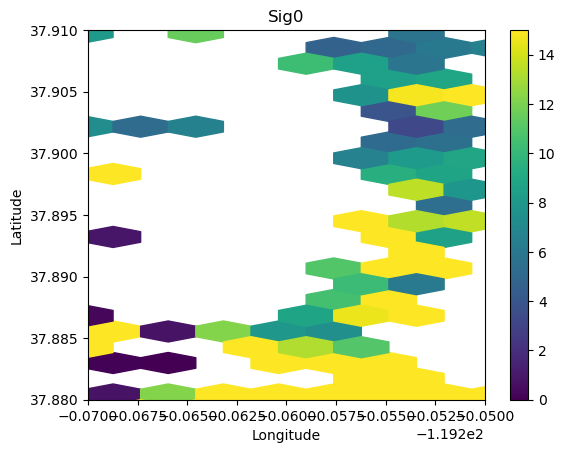

In [432]:
mask = (ds_PIXC_summer.classification > 0) 
plt.hexbin(ds_PIXC_summer.longitude[mask], ds_PIXC_summer.latitude[mask], 
           C=ds_PIXC_summer.sig0[mask], gridsize=500, reduce_C_function=np.mean)
# Reduce range of colorbar to focus on typical sig0 values
# plt.clim(-10, 30)
plt.clim(0,15)
plt.xlim(-119.27, -119.25)
plt.ylim(37.88, 37.91)

# plt.ylim(39.2,40)
plt.colorbar()
# Label the colorbar
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Sig0')
plt.show()

here


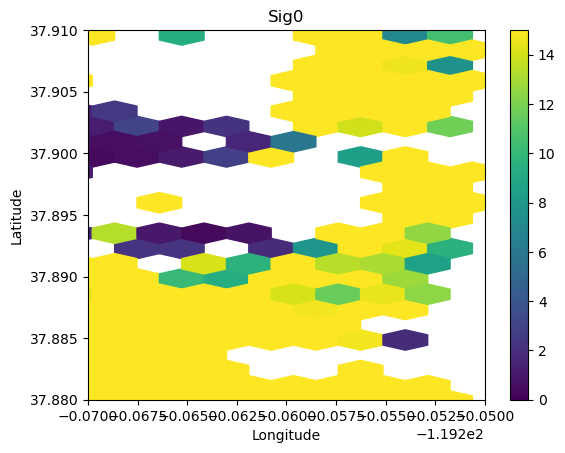

In [433]:

print('here')
mask = (ds_PIXC_winter.classification > 0) 
plt.hexbin(ds_PIXC_winter.longitude[mask], ds_PIXC_winter.latitude[mask], 
           C=ds_PIXC_winter.sig0[mask], gridsize=500, reduce_C_function=np.mean)
# Reduce range of colorbar to focus on typical sig0 values
# plt.clim(-10, 30)
plt.clim(0,15)
plt.xlim(-119.27, -119.25)
plt.ylim(37.88, 37.91)
# plt.xlim(-121.4, -120.4)
# plt.xlim(-120.8, -120)
# plt.ylim(39.2,40)
plt.colorbar()
# Label the colorbar
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Sig0')
plt.show()

In [298]:
test_snow_tile = xr.open_dataset("/Volumes/LivnehExternal05/CriticalData/SAMI/WUS_UCLA_SR/WUS_UCLA_SR_v01_N37_0W120_0_agg_16_WY2016_17_SWE_SCA_POST.nc")

In [434]:
# ds_PIXC_winter.sel(latitude=slice(37.88, 37.91), longitude=slice(-119.27, -119.25))
lat_min, lat_max = 37.88, 37.91
lon_min, lon_max = -119.27, -119.25
mask = (
    (ds_PIXC_winter['latitude'] >= lat_min) &
    (ds_PIXC_winter['latitude'] <= lat_max) &
    (ds_PIXC_winter['longitude'] >= lon_min) &
    (ds_PIXC_winter['longitude'] <= lon_max)
)
subset_winter = ds_PIXC_winter.isel(points=mask.values)  # or whatever your dim is named

mask = (
    (ds_PIXC_summer['latitude'] >= lat_min) &
    (ds_PIXC_summer['latitude'] <= lat_max) &
    (ds_PIXC_summer['longitude'] >= lon_min) &
    (ds_PIXC_summer['longitude'] <= lon_max)
)
subset_summer = ds_PIXC_summer.isel(points=mask.values)  # or whatever your dim is named

In [452]:
# ds_PIXC_winter.sel(latitude=slice(37.88, 37.91), longitude=slice(-119.27, -119.25))
lat_min_tiny, lat_max_tiny = 37.8935, 37.89525
lon_min_tiny, lon_max_tiny = -119.255, -119.253
mask = (
    (ds_PIXC_winter['latitude'] >= lat_min_tiny) &
    (ds_PIXC_winter['latitude'] <= lat_max_tiny) &
    (ds_PIXC_winter['longitude'] >= lon_min_tiny) &
    (ds_PIXC_winter['longitude'] <= lon_max_tiny)
)
subset_winter_tiny = ds_PIXC_winter.isel(points=mask.values)  # or whatever your dim is named

mask = (
    (ds_PIXC_summer['latitude'] >= lat_min_tiny) &
    (ds_PIXC_summer['latitude'] <= lat_max_tiny) &
    (ds_PIXC_summer['longitude'] >= lon_min_tiny) &
    (ds_PIXC_summer['longitude'] <= lon_max_tiny)
)
subset_summer_tiny = ds_PIXC_summer.isel(points=mask.values)  # or whatever your dim is named

In [453]:
print(subset_summer_tiny.height.mean().values)
print(subset_winter_tiny.height.mean().values)

2951.728
2952.2766


In [478]:
test_snow_tile.sel(Latitude=slice(lat_min, lat_max), Longitude=slice(lon_min, lon_max))
filename = "/Users/masa6503/Downloads/output_hh.tif"
tif_data = rxr.open_rasterio(filename)
# Ensure the data has a CRS and spatial dimensions set to epsg 4326
tif_data = tif_data.rio.write_crs("EPSG:4326", inplace=True)
# tif_data.plot()

In [ ]:
# Calculate difference between winter heigh and tif dem
subset_winter = subset_winter.assign(dem_diff=subset_winter.height - tif_data.values[0])

ValueError: operands could not be broadcast together with shapes (3896,) (108,55) 

In [488]:
from scipy.interpolate import RegularGridInterpolator
import numpy as np

# --- Extract DEM grid axes and values ---
# Adjust coordinate names to match your tif_data
dem_lats = tif_data['y'].values   # or 'lat', 'latitude'
dem_lons = tif_data['x'].values   # or 'lon', 'longitude'
dem_vals = tif_data.squeeze().values  # drops any size-1 dimensions (e.g. band)       # 2D array (lat, lon)

# DEM lats often go high->low (north->south), 
# RegularGridInterpolator requires monotonically increasing
if dem_lats[0] > dem_lats[-1]:
    dem_lats = dem_lats[::-1]
    dem_vals = dem_vals[::-1, :]

# --- Build interpolator ---
interpolator = RegularGridInterpolator(
    (dem_lats, dem_lons),
    dem_vals,
    method='linear',
    bounds_error=False,
    fill_value=np.nan  # points outside DEM extent get NaN
)

# --- Sample DEM at each point cloud location ---
pc_lats = subset_winter['latitude'].values   # adjust name as needed
pc_lons = subset_winter['longitude'].values

dem_at_points = interpolator(np.column_stack([pc_lats, pc_lons]))

# --- Compute difference ---
# point cloud height minus DEM height
height_diff = subset_winter['height'].values - dem_at_points  # adjust variable name

# --- Optionally attach back to xarray ---
subset_winter['height_diff'] = ('points', height_diff)  # adjust dim name

In [490]:
subset_winter.height_diff

<xarray.DataArray 'height_diff' (points: 3896)> Size: 31kB
array([         nan,          nan,          nan, ..., -26.7284237 ,
       -27.29965697, -28.10878603], shape=(3896,))
Coordinates:
    latitude   (points) float64 31kB 37.88 37.88 37.88 ... 37.91 37.91 37.91
    longitude  (points) float64 31kB -119.3 -119.3 -119.3 ... -119.3 -119.3
Dimensions without coordinates: points

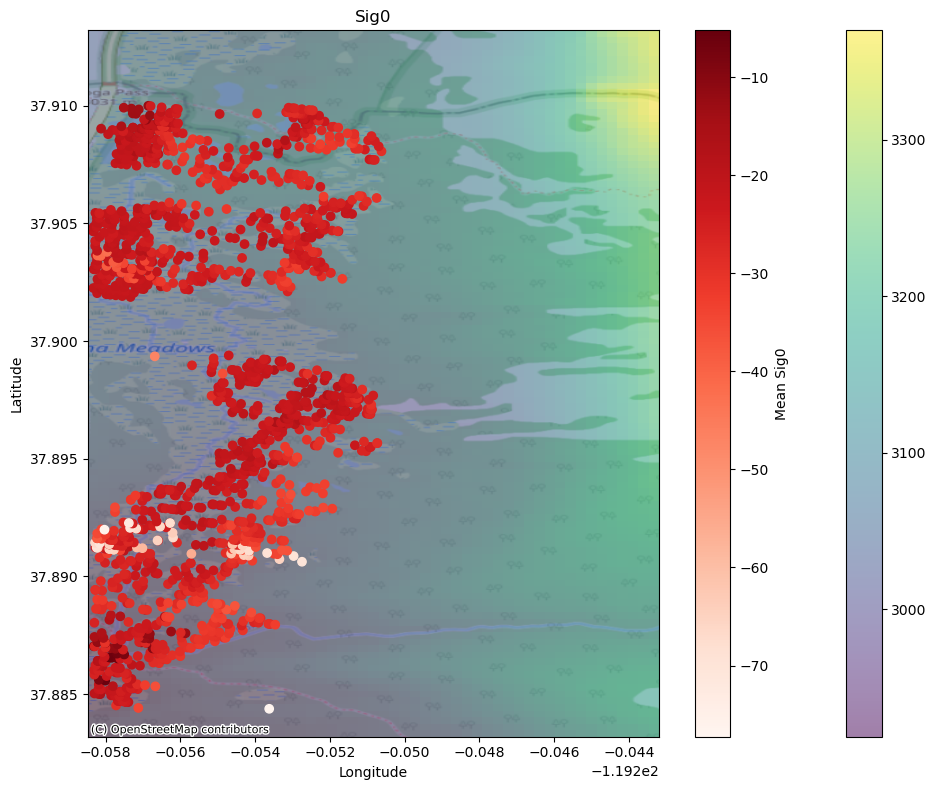

In [493]:
import contextily as ctx
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from shapely.geometry import Point
# ds_PIXC = ds_PIXC_winter
# Build a GeoDataFrame from your masked points
# mask = (ds_PIXC.classification > 0)
# lons = ds_PIXC.longitude[mask].values
# lats = ds_PIXC.latitude[mask].values
# sig0 = ds_PIXC.sig0[mask].values

subset = subset_summer

# Create hexbin on a regular axes first to get the extent
fig, ax = plt.subplots(figsize=(10, 8))
# test_snow_tile.sel(Day=147, Stats=0).SWE_Post.plot(ax=ax, x='Longitude', y='Latitude', vmin=0, vmax=2, alpha=0.5)

# hb = ax.hexbin(
#     lons, lats,
#     C=sig0,
#     gridsize=500,
#     reduce_C_function=np.mean,
#     cmap='Reds',
#     alpha=0.8,          # partial transparency so basemap shows through
#     transform=ax.transData,
#     vmin=0,  # set minimum colorbar value to 0
#     vmax=15  # set maximum colorbar value to 50
# )
tif_data.plot(ax=ax, x='x', y='y',alpha=0.5)
# scatter1 = ax.scatter(x=subset_winter.longitude, y=subset_winter.latitude, c=subset_winter.height, cmap='Reds', vmin=2940, vmax=2960, alpha=1)
scatter1 = ax.scatter(x=subset_winter.longitude, y=subset_winter.latitude, c=subset_winter.height_diff, cmap='Reds', alpha=1)
# scatter2 = ax.scatter(x=subset.longitude, y=subset.latitude, c=subset.height, cmap='Blues', vmin=2940, vmax=2960, alpha=1)
plt.colorbar(scatter1, ax=ax, label='Mean Sig0')
# plt.colorbar(scatter2, ax=ax, label='Mean Sig0')

# # Set limits (required before adding basemap)
# # ax.set_xlim(lons.min(), lons.max())
# # ax.set_ylim(lats.min(), lats.max())

# ax.set_xlim(-119.27, -119.25)
# ax.set_ylim(37.88, 37.91)

# # ax.set_xlim(lon_min_tiny, lon_max_tiny)
# # ax.set_ylim(lat_min_tiny, lat_max_tiny)

# # Add Dana meadows box
# dana_box = gpd.GeoDataFrame(
#     {'geometry': [shapely.geometry.box(lon_min_tiny, lat_min_tiny, lon_max_tiny, lat_max_tiny)]},
#     crs='EPSG:4326'
# )
# dana_box.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2)
# Plot DEM tif data

# Add basemap — contextily expects the axes CRS to be Web Mercator (EPSG:3857)
# but if your data is in WGS84 lon/lat (EPSG:4326), use crs= parameter:
ctx.add_basemap(
    ax,
    crs='EPSG:4326',           # tell contextily your data is in lon/lat
    source=ctx.providers.OpenStreetMap.Mapnik,  # free, no API key needed
    zoom='auto',
)


ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Sig0')
plt.tight_layout()
plt.show()

In [314]:
# ds_PIXC_winter.sel(latitude=slice(37.88, 37.91), longitude=slice(-119.27, -119.25))
lat_min, lat_max = 37.88, 37.91
lon_min, lon_max = -119.27, -119.25
mask = (
    (ds_PIXC_winter['latitude'] >= lat_min) &
    (ds_PIXC_winter['latitude'] <= lat_max) &
    (ds_PIXC_winter['longitude'] >= lon_min) &
    (ds_PIXC_winter['longitude'] <= lon_max)
)
subset = ds_PIXC_winter.isel(points=mask.values)  # or whatever your dim is named

In [315]:
subset

<xarray.Dataset> Size: 1MB
Dimensions:                                (points: 3896, complex_depth: 2,
                                            num_pixc_lines: 3276)
Coordinates:
    latitude                               (points) float64 31kB 37.88 ... 37.91
    longitude                              (points) float64 31kB -119.3 ... -...
Dimensions without coordinates: points, complex_depth, num_pixc_lines
Data variables: (12/62)
    azimuth_index                          (points) float64 31kB 2.102e+03 .....
    range_index                            (points) float64 31kB 2.14e+03 ......
    interferogram                          (points, complex_depth) float32 31kB ...
    power_plus_y                           (points) float32 16kB 2.021e+06 .....
    power_minus_y                          (points) float32 16kB 1.879e+06 .....
    coherent_power                         (points) float32 16kB 1.949e+06 .....
    ...                                     ...
    pixc_line_qual                         (num_pixc_lines) float64 26kB 1.0 ...
    pixc_line_to_tvp                       (num_pixc_lines) float32 13kB 339....
    data_window_first_valid                (num_pixc_lines) float64 26kB 1.15...
    data_window_last_valid                 (num_pixc_lines) float64 26kB 5.59...
    data_window_first_cross_track          (num_pixc_lines) float32 13kB 3.14...
    data_window_last_cross_track           (num_pixc_lines) float32 13kB 6.16...
Attributes:
    description:                 cloud of geolocated interferogram pixels
    interferogram_size_azimuth:  3276
    interferogram_size_range:    5974
    looks_to_efflooks:           1.5498995082355929
    num_azimuth_looks:           7.0
    azimuth_offset:              6

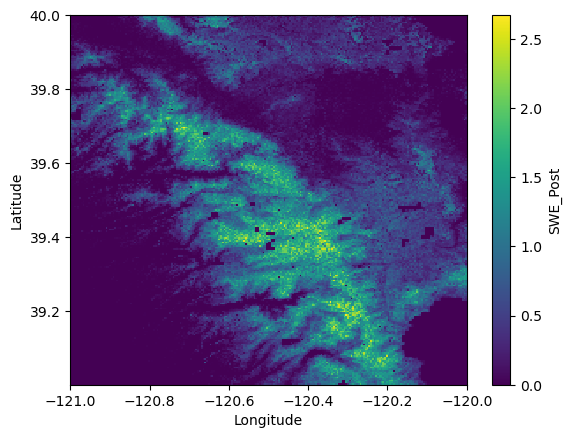

In [129]:
test_snow_tile.sel(Day=147, Stats=0).SWE_Post.plot(x="Longitude", y="Latitude")

In [65]:
test_snow_tile.Stats.values

array([0, 1, 2, 3, 4])

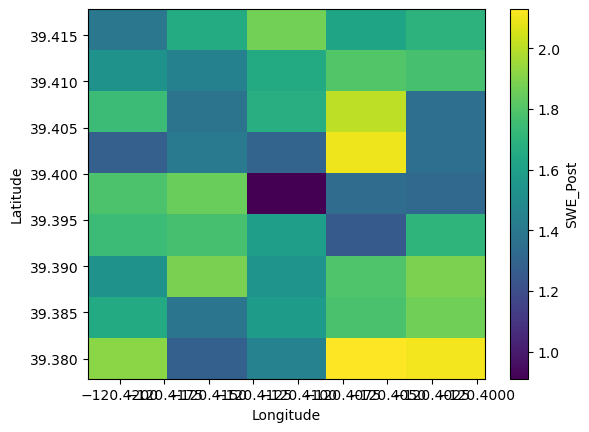

In [145]:
test_snow_tile.sel(Day=147, Stats=0).SWE_Post.sel(Latitude=slice(39.42,39.38), Longitude=slice(-120.42,-120.4)).plot(x="Longitude", y="Latitude")

here


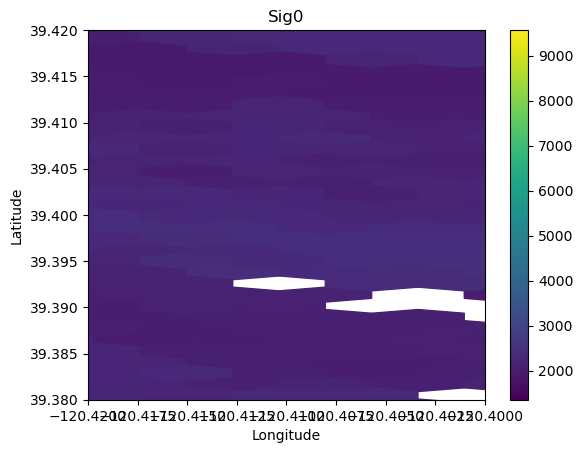

In [ ]:
print('here')
# mask = (ds_PIXC_winter.classification > 0) 
plt.hexbin(ds_PIXC_winter.longitude[mask], ds_PIXC_winter.latitude[mask], 
           C=ds_PIXC_winter.height[mask], gridsize=500, reduce_C_function=np.mean)
# Reduce range of colorbar to focus on typical sig0 values
# plt.clim(-10, 30)
# plt.clim(0,15)
plt.xlim(-120.42,-120.4)
plt.ylim(39.38,39.42)
# plt.ylim(39.2,40)
plt.colorbar()
# Label the colorbar
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Sig0')
plt.show()

here


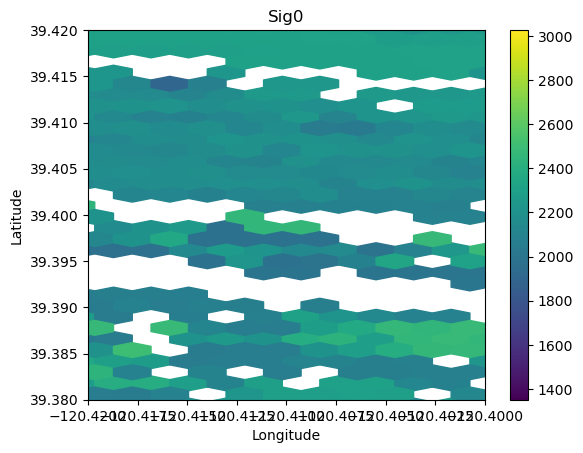

In [149]:
print('here')
mask = (ds_PIXC_summer.classification > 0) 
plt.hexbin(ds_PIXC_summer.longitude[mask], ds_PIXC_summer.latitude[mask], 
           C=ds_PIXC_summer.height[mask], gridsize=500, reduce_C_function=np.mean)
# Reduce range of colorbar to focus on typical sig0 values
# plt.clim(-10, 30)
# plt.clim(0,15)
plt.xlim(-120.42,-120.4)
plt.ylim(39.38,39.42)
# plt.ylim(39.2,40)
plt.colorbar()
# Label the colorbar
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Sig0')
plt.show()

In [150]:
ds_PIXC_winter_clipped = ds_PIXC_winter.sel(longitude=slice(-120.42,-120.4), latitude=slice(39.38,39.42))

KeyError: "no index found for coordinate 'longitude'"

In [154]:
ds_PIXC_winter.height

<xarray.DataArray 'height' (points: 5157034)> Size: 21MB
array([2032.179 , 2032.676 , 1989.6083, ..., 1555.8092, 1554.7805,
       1543.7485], shape=(5157034,), dtype=float32)
Coordinates:
    latitude   (points) float64 41MB 39.29 39.29 39.29 ... 39.71 39.71 39.71
    longitude  (points) float64 41MB -120.6 -120.6 -120.6 ... -119.7 -119.7
Dimensions without coordinates: points
Attributes:
    long_name:     height above reference ellipsoid
    units:         m
    quality_flag:  geolocation_qual
    valid_min:     -1500.0
    valid_max:     15000.0
    comment:       Height of the pixel above the reference ellipsoid.

In [255]:
passes = ['567']
potential_tiles = ['227R', '228R', '229R']
river_results = []
for p in passes:
    print(p)
    river_results += earthaccess.search_data(
    short_name='SWOT_L2_HR_Raster_2.0',
    temporal=('2024-06-01 00:00:00', '2025-03-15 23:59:59'),
    granule_name=f'*100m*_567_*',
    # bounding_box=(-125, 24, -66.5, 45)  # CONUS
    # bounding_box=(-121.44, 39.5, -120.2, 40.1)
    bounding_box=(-119.26,37.85,-119.24,37.91)
)

567


In [256]:
river_results

[Collection: {'Version': '2.0', 'ShortName': 'SWOT_L2_HR_Raster_2.0'}
 Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'GPolygons': [{'Boundary': {'Points': [{'Latitude': 37.47471768609013, 'Longitude': -120.59263638749265}, {'Latitude': 37.47471768609013, 'Longitude': -118.84729037906152}, {'Latitude': 38.85244668006765, 'Longitude': -118.84729037906152}, {'Latitude': 38.85244668006765, 'Longitude': -120.59263638749265}, {'Latitude': 37.47471768609013, 'Longitude': -120.59263638749265}]}}]}, 'Track': {'Cycle': 16, 'Passes': [{'Pass': 567, 'Tiles': ['220L', '221L', '222L', '223L', '220R', '221R', '222R', '223R']}]}}}
 Temporal coverage: {'RangeDateTime': {'EndingDateTime': '2024-06-18T10:46:07.418Z', 'BeginningDateTime': '2024-06-18T10:45:46.321Z'}}
 Size(MB): 49.467092514038086
 Data: ['https://archive.swot.podaac.earthdata.nasa.gov/podaac-swot-ops-cumulus-protected/SWOT_L2_HR_Raster_2.0/SWOT_L2_HR_Raster_100m_UTM11S_N_x_x_x_016_567_111F_20240618T104546_20240618T104607_PIC

In [267]:
river_results[6]

Collection: {'Version': '2.0', 'ShortName': 'SWOT_L2_HR_Raster_2.0'}
Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'GPolygons': [{'Boundary': {'Points': [{'Latitude': 37.72449613923345, 'Longitude': -120.59263638749265}, {'Latitude': 37.47471768609013, 'Longitude': -119.17754957890855}, {'Latitude': 38.59680331004281, 'Longitude': -118.84729037906152}, {'Latitude': 38.85244668006765, 'Longitude': -120.28259712165561}, {'Latitude': 37.72449613923345, 'Longitude': -120.59263638749265}]}}], 'BoundingRectangles': [{'WestBoundingCoordinate': -120.59263638749265, 'SouthBoundingCoordinate': 37.47471768609013, 'EastBoundingCoordinate': -118.84729037906152, 'NorthBoundingCoordinate': 38.85244668006765}]}, 'Track': {'Cycle': 24, 'Passes': [{'Pass': 567, 'Tiles': ['220L', '221L', '222L', '223L', '220R', '221R', '222R', '223R']}]}}}
Temporal coverage: {'RangeDateTime': {'EndingDateTime': '2024-12-02T08:46:46.193Z', 'BeginningDateTime': '2024-12-02T08:46:25.100Z'}}
Size(MB): 46.48260974884033
Data: ['https://archive.swot.podaac.earthdata.nasa.gov/podaac-swot-ops-cumulus-protected/SWOT_L2_HR_Raster_2.0/SWOT_L2_HR_Raster_100m_UTM11S_N_x_x_x_024_567_111F_20241202T084625_20241202T084646_PIC2_01.nc']

In [268]:
raster_file_winter=earthaccess.download([river_results[-1]], "./data_downloads")
raster_file_summer=earthaccess.download([river_results[6]], "./data_downloads")

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

In [269]:
winter_raster = xr.open_dataset(raster_file_winter[0], engine='h5netcdf')[['wse']]
summer_raster = xr.open_dataset(raster_file_summer[0], engine='h5netcdf')[['wse']]

In [270]:
import rioxarray as rxr
original_epsg = 32611
winter_raster = winter_raster.rio.write_crs(f"EPSG:{original_epsg}")
winter_raster = winter_raster.rio.set_spatial_dims(x_dim='x', y_dim='y')
winter_raster_wgs84 = winter_raster.rio.reproject("EPSG:4326")

summer_raster = summer_raster.rio.write_crs(f"EPSG:{original_epsg}")
summer_raster = summer_raster.rio.set_spatial_dims(x_dim='x', y_dim='y')
summer_raster_wgs84 = summer_raster.rio.reproject("EPSG:4326")

(37.8, 37.9)

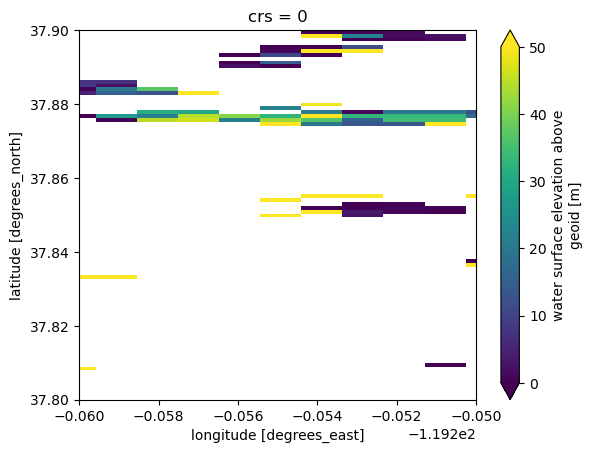

In [271]:
difference = winter_raster_wgs84 - summer_raster_wgs84
difference.wse.plot(vmin=0, vmax=50)
plt.xlim(-119.26, -119.25)
plt.ylim(37.8, 37.9)

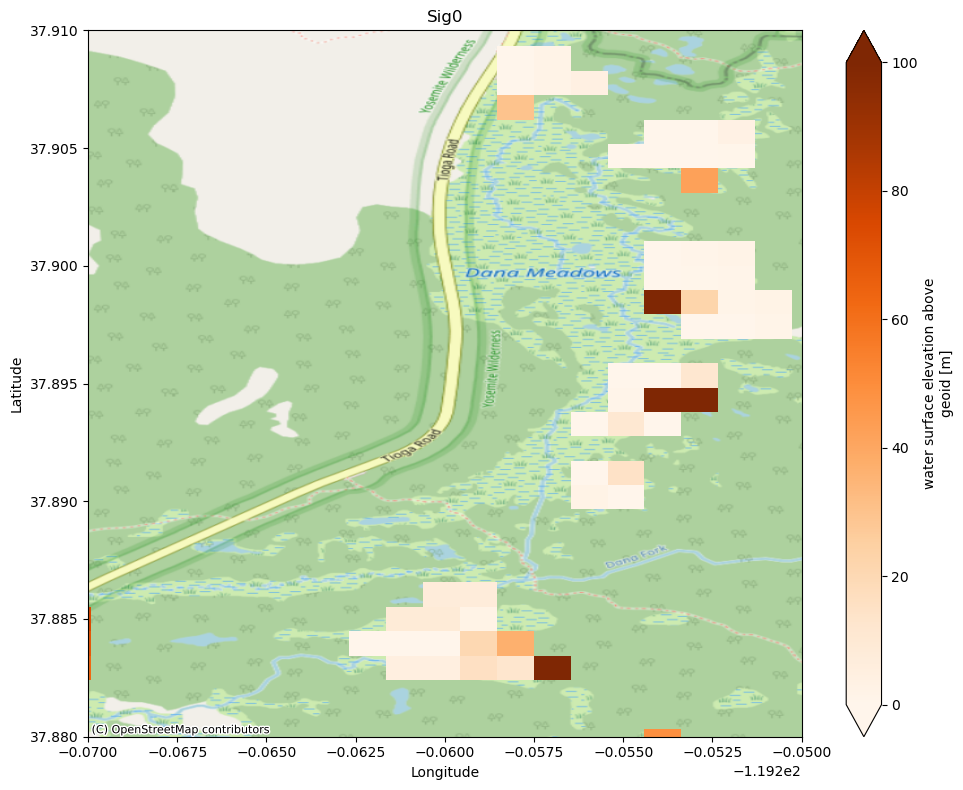

In [291]:
import contextily as ctx
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from shapely.geometry import Point
# ds_PIXC = ds_PIXC_winter
# # Build a GeoDataFrame from your masked points
# mask = (ds_PIXC.classification > 0)
# lons = ds_PIXC.longitude[mask].values
# lats = ds_PIXC.latitude[mask].values
# sig0 = ds_PIXC.sig0[mask].values

# Create hexbin on a regular axes first to get the extent
fig, ax = plt.subplots(figsize=(10, 8))
# test_snow_tile.sel(Day=147, Stats=0).SWE_Post.plot(ax=ax, x='Longitude', y='Latitude')
difference.wse.plot(vmin=0, vmax=100, cmap='Oranges')
# summer_raster_wgs84.wse.plot(vmin=0, vmax=50, cmap='Oranges')
# winter_raster_wgs84.wse.plot(vmin=0, vmax=50, cmap='Blues', alpha=0.5)

# Set limits (required before adding basemap)
ax.set_xlim(lons.min(), lons.max())
ax.set_ylim(lats.min(), lats.max())

ax.set_xlim(-119.27, -119.25)
ax.set_ylim(37.88, 37.91)
# ax.set_ylim(lats.min(), lats.max())

# Add basemap — contextily expects the axes CRS to be Web Mercator (EPSG:3857)
# but if your data is in WGS84 lon/lat (EPSG:4326), use crs= parameter:
ctx.add_basemap(
    ax,
    crs='EPSG:4326',           # tell contextily your data is in lon/lat
    source=ctx.providers.OpenStreetMap.Mapnik,  # free, no API key needed
    zoom='auto',
)

# plt.colorbar(hb, ax=ax, label='Mean Sig0')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Sig0')
plt.tight_layout()
plt.show()

In [215]:
# Count non-NaN values in the difference
num_valid_pixels = np.sum(~np.isnan(difference.wse.values))
print(f"Number of valid pixels in the difference: {num_valid_pixels}")

# Count non-NaN values in the summer raster
num_valid_pixels_summer = np.sum(~np.isnan(summer_raster_wgs84.wse.values))
print(f"Number of valid pixels in the summer raster: {num_valid_pixels_summer}")    

# Count non-NaN values in the winter raster
num_valid_pixels_winter = np.sum(~np.isnan(winter_raster_wgs84.wse.values))
print(f"Number of valid pixels in the winter raster: {num_valid_pixels_winter}")
# summer_raster_wgs84.wse.values

Number of valid pixels in the difference: 201888
Number of valid pixels in the summer raster: 345557
Number of valid pixels in the winter raster: 446327


In [559]:
river_results

[Collection: {'Version': 'D', 'ShortName': 'SWOT_L2_HR_PIXC_D'}
 Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'BoundingRectangles': [{'WestBoundingCoordinate': -119.55752969746192, 'SouthBoundingCoordinate': 37.414121275095276, 'EastBoundingCoordinate': -118.93004214302155, 'NorthBoundingCoordinate': 38.16666843721529}]}, 'Track': {'Cycle': 1, 'Passes': [{'Pass': 567, 'Tiles': ['221R']}]}}}
 Temporal coverage: {'RangeDateTime': {'EndingDateTime': '2023-08-10T11:29:45.970Z', 'BeginningDateTime': '2023-08-10T11:29:34.877Z'}}
 Size(MB): 409.4978380203247
 Data: ['https://archive.swot.podaac.earthdata.nasa.gov/podaac-swot-ops-cumulus-protected/SWOT_L2_HR_PIXC_D/SWOT_L2_HR_PIXC_001_567_221R_20230810T112934_20230810T112945_PGD0_01.nc'],
 Collection: {'Version': 'D', 'ShortName': 'SWOT_L2_HR_PIXC_D'}
 Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'BoundingRectangles': [{'WestBoundingCoordinate': -119.5576737787942, 'SouthBoundingCoordinate': 37.41406761180351, 'Ea

SWOT_L2_HR_PIXC_005_567_221R_20231101T222952_20231101T223003_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

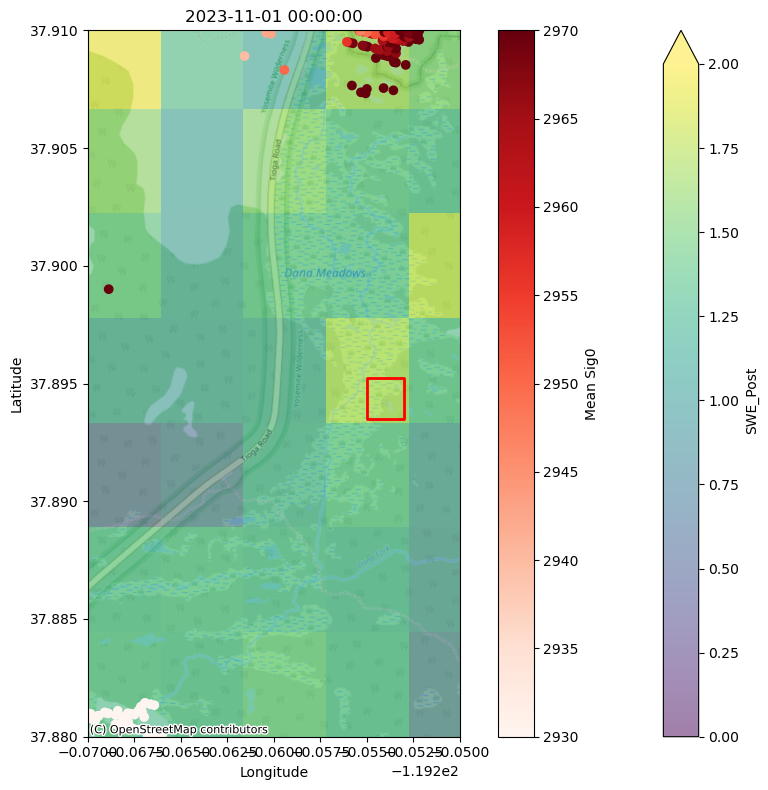

nan
nan
SWOT_L2_HR_PIXC_006_567_221R_20231122T191458_20231122T191509_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

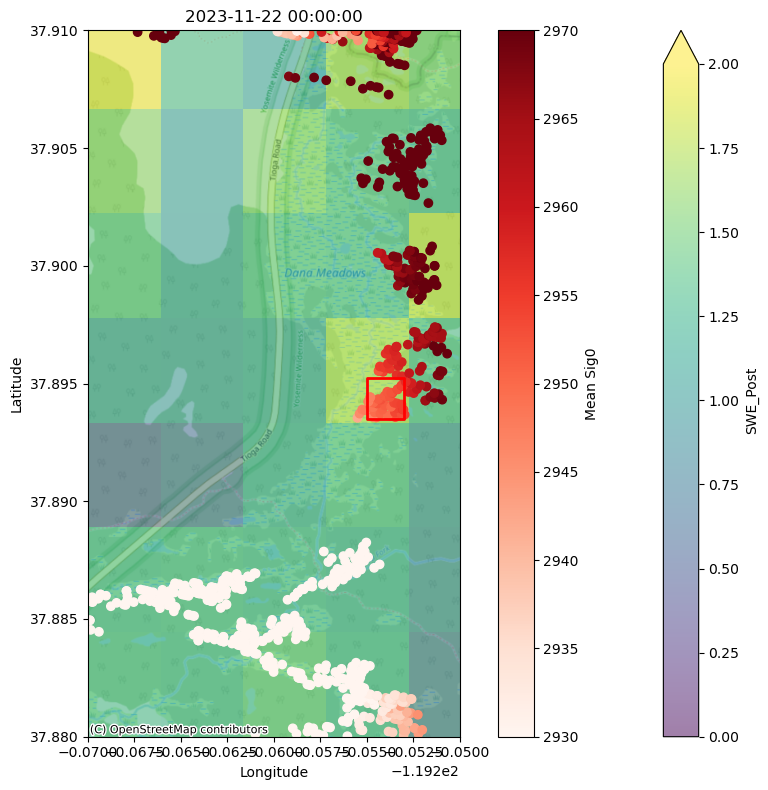

2951.8267
-26.141994871992424
SWOT_L2_HR_PIXC_007_567_221R_20231213T160001_20231213T160012_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

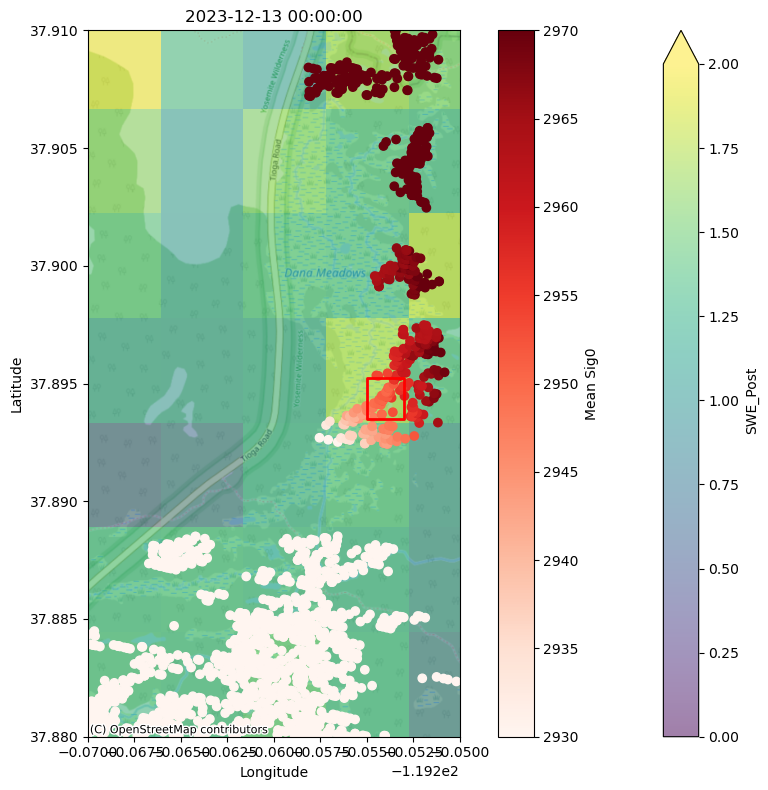

2951.544
-23.960992041499303
SWOT_L2_HR_PIXC_008_567_221R_20240103T124508_20240103T124519_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

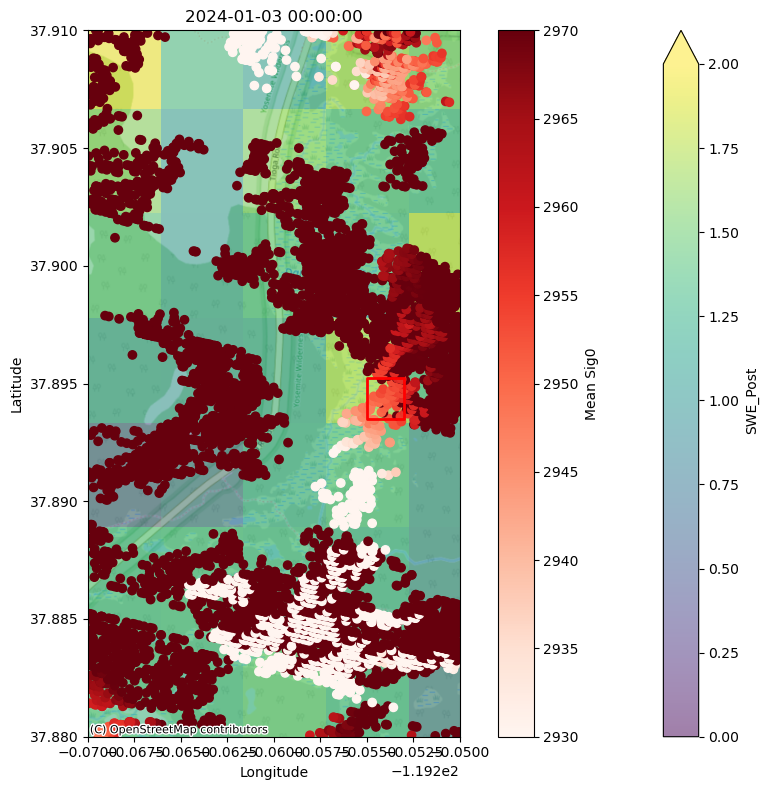

2952.763
-24.643030652547186
SWOT_L2_HR_PIXC_009_567_221R_20240124T093014_20240124T093025_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

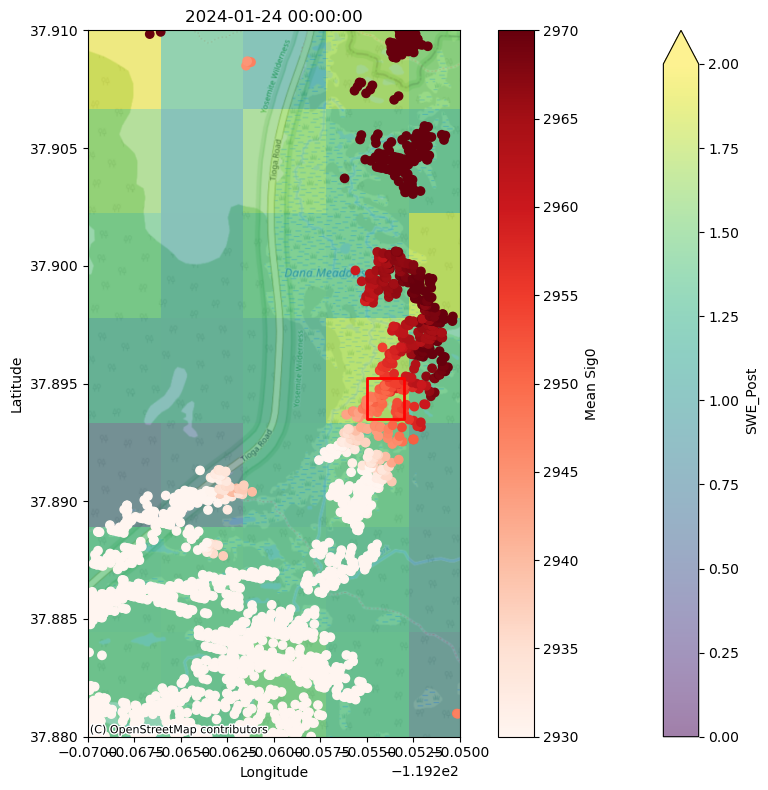

2951.3972
-23.969302089489222
SWOT_L2_HR_PIXC_010_567_221R_20240214T061518_20240214T061529_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

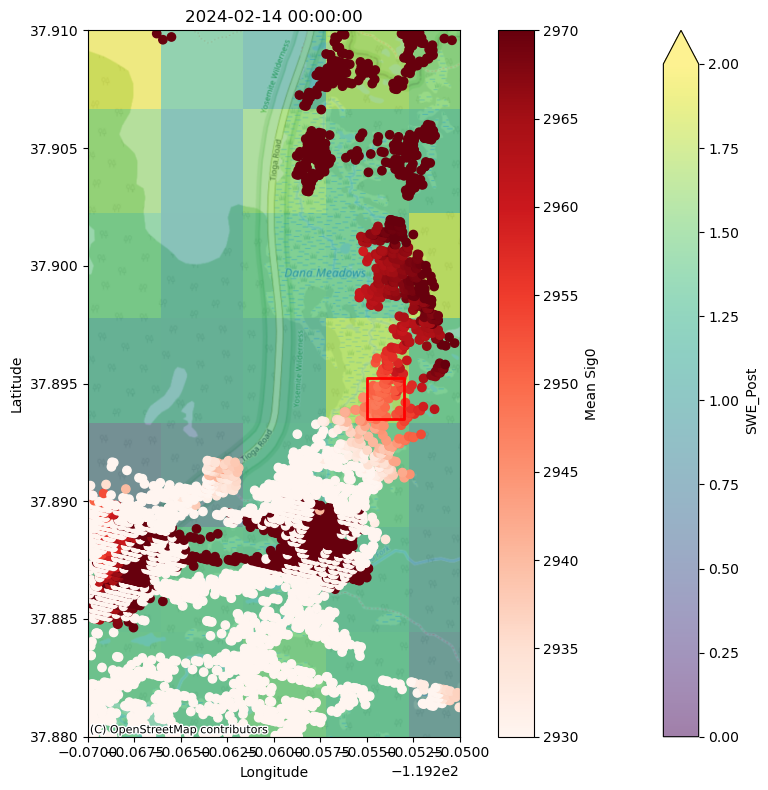

2950.777
-24.368003923627594
SWOT_L2_HR_PIXC_011_567_221R_20240306T030023_20240306T030034_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

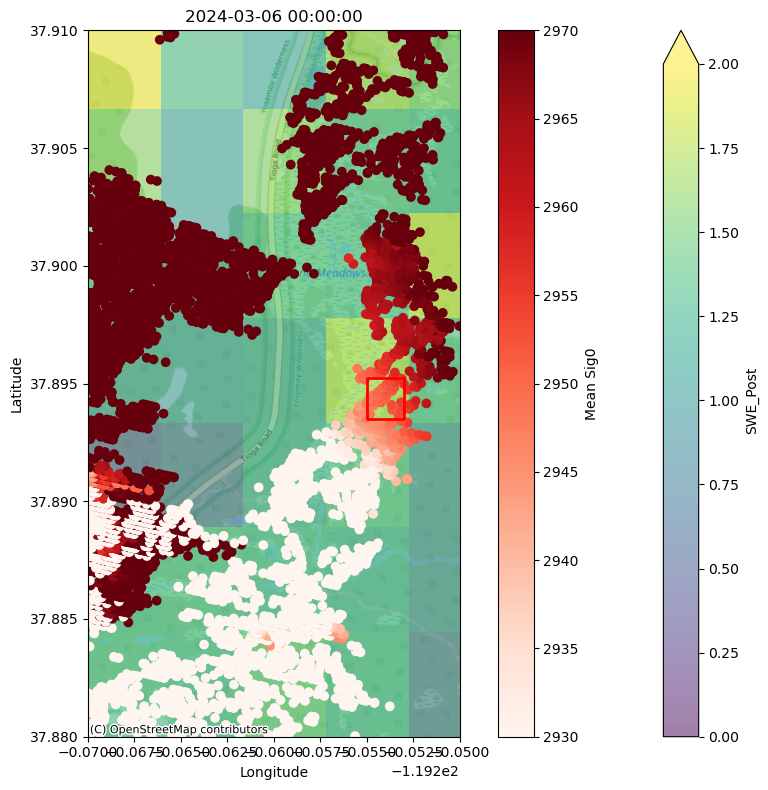

2952.0981
-23.853476456112457
SWOT_L2_HR_PIXC_012_567_221R_20240326T234526_20240326T234537_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

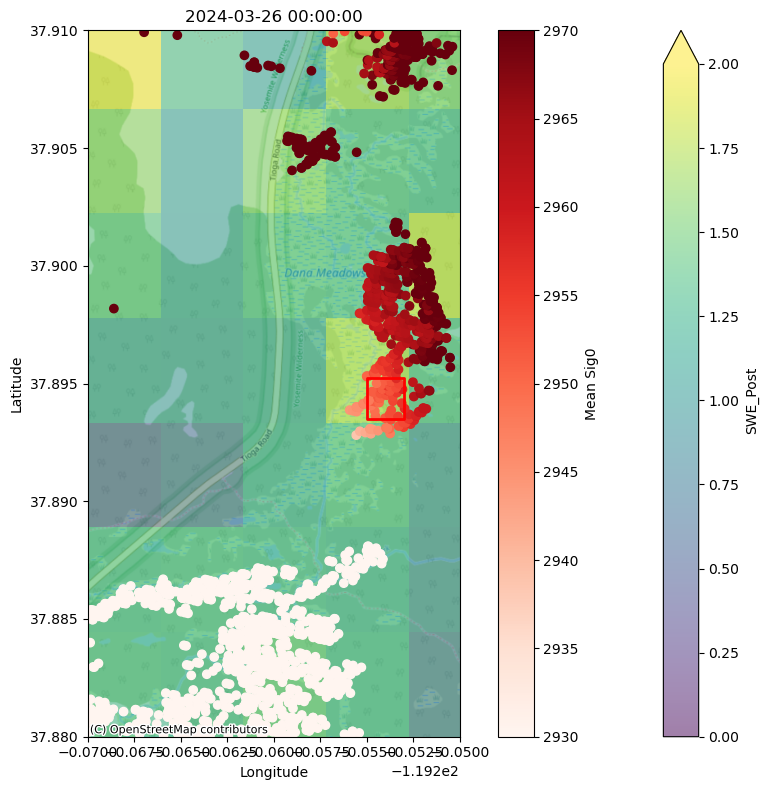

2952.6384
-23.469627563674024
SWOT_L2_HR_PIXC_013_567_221R_20240416T203032_20240416T203043_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

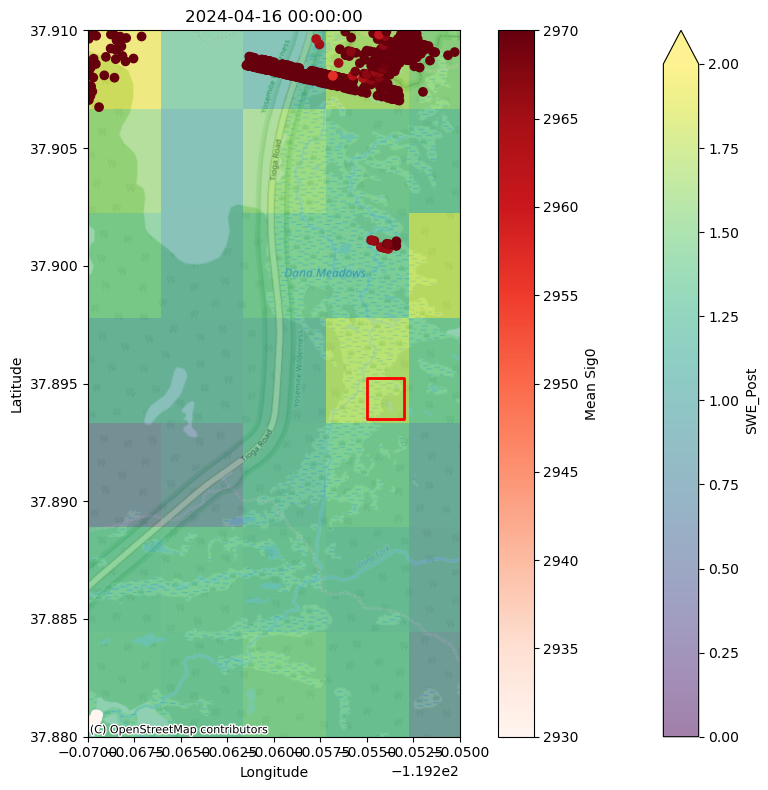

nan
nan
SWOT_L2_HR_PIXC_014_567_221R_20240507T171535_20240507T171546_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

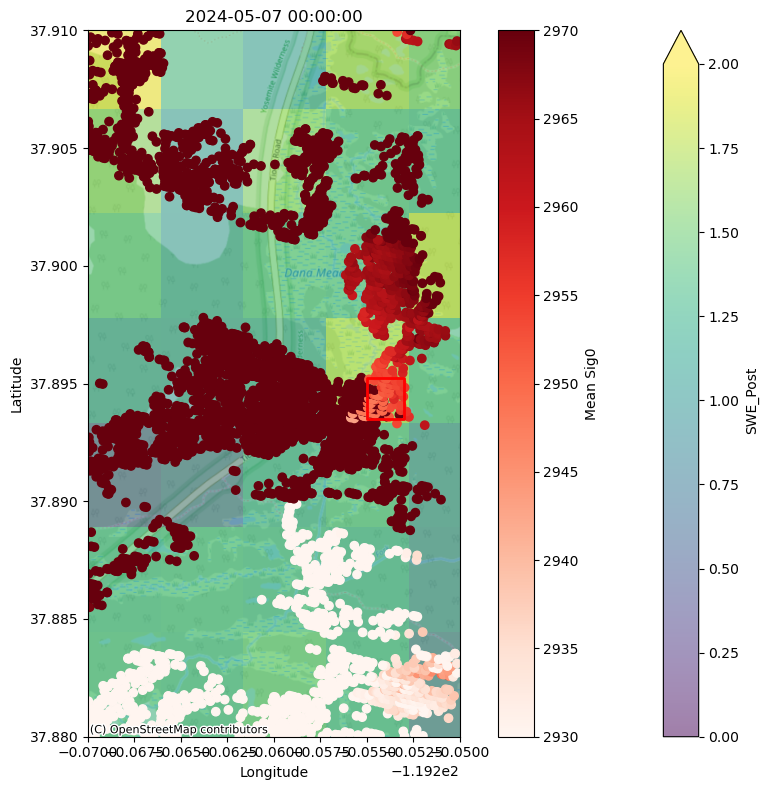

2952.4163
-22.914474544192515
SWOT_L2_HR_PIXC_015_567_221R_20240528T140040_20240528T140052_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

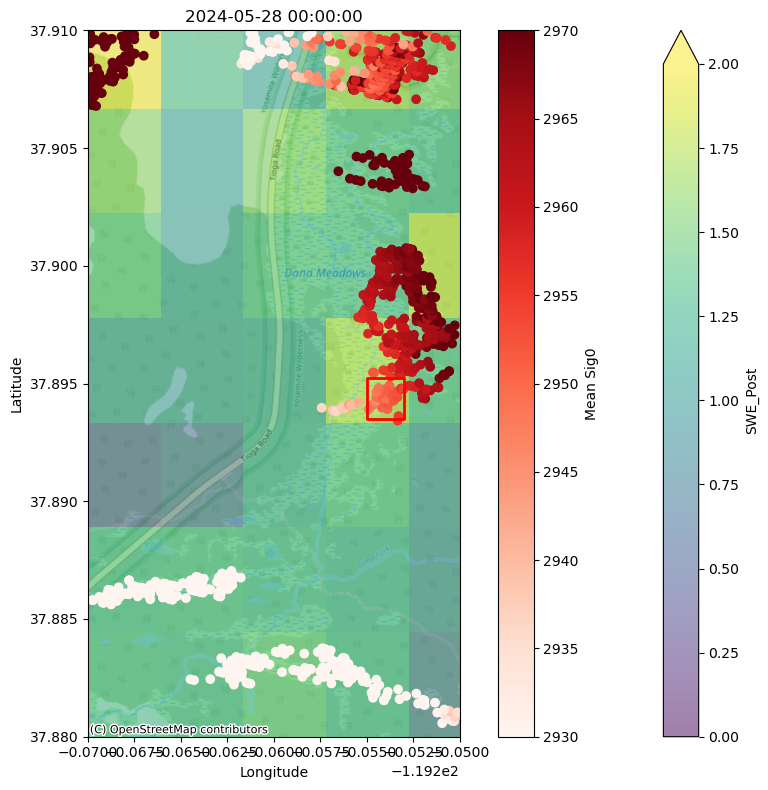

2951.2053
-24.993417943298628
SWOT_L2_HR_PIXC_016_567_221R_20240618T104546_20240618T104557_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

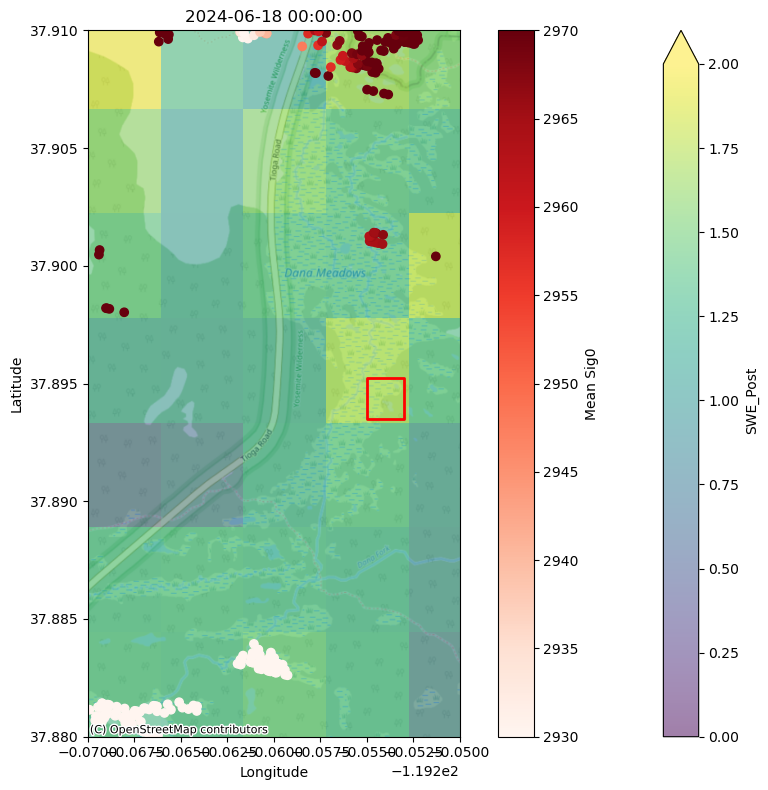

nan
nan
SWOT_L2_HR_PIXC_017_567_221R_20240709T073049_20240709T073100_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

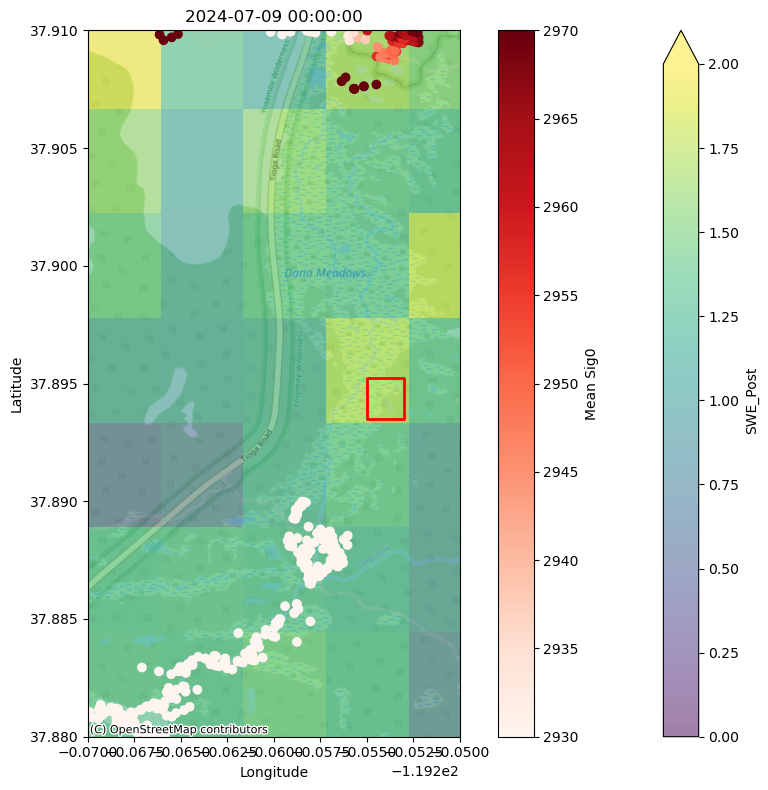

nan
nan
SWOT_L2_HR_PIXC_018_567_221R_20240730T041554_20240730T041605_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

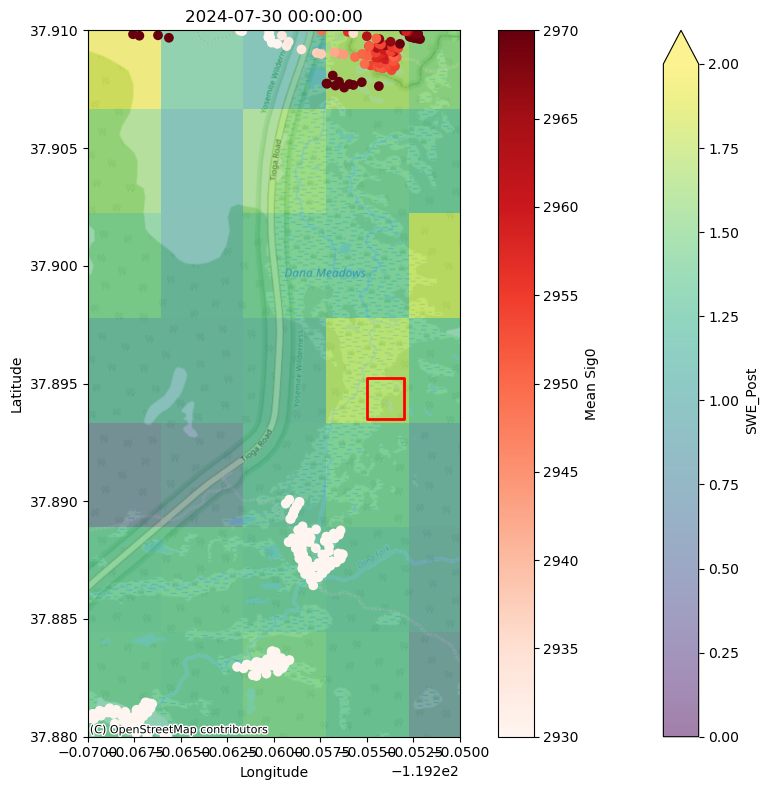

nan
nan
SWOT_L2_HR_PIXC_019_567_221R_20240820T010058_20240820T010109_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

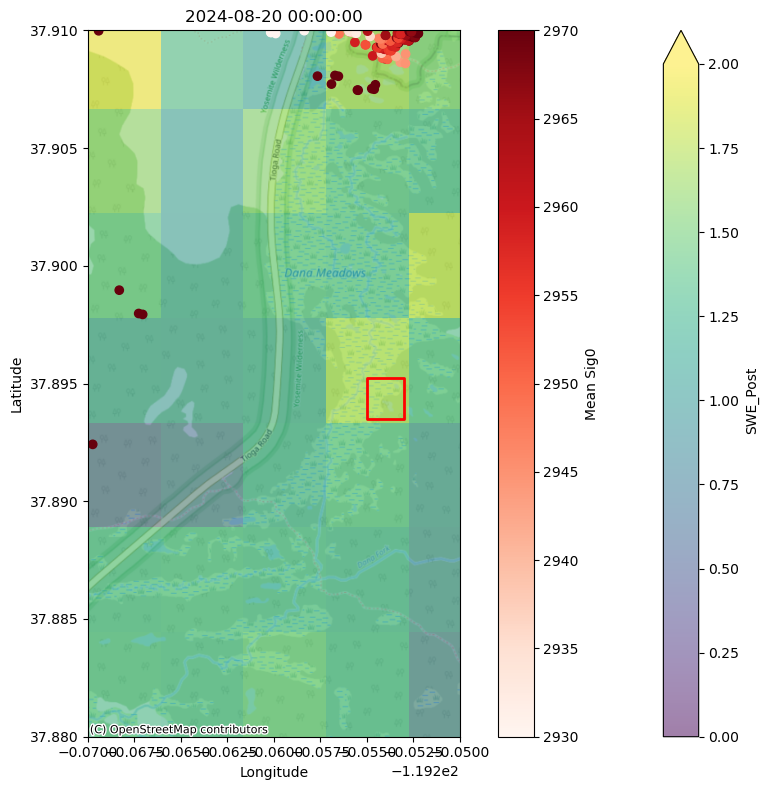

nan
nan
SWOT_L2_HR_PIXC_020_567_221R_20240909T214604_20240909T214615_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

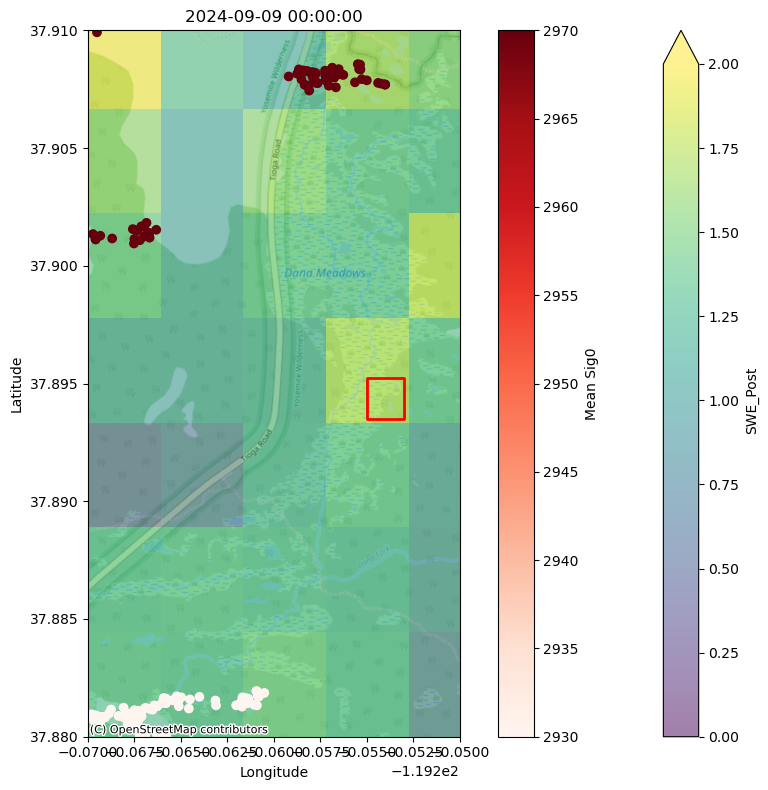

nan
nan
SWOT_L2_HR_PIXC_021_567_221R_20240930T183112_20240930T183123_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

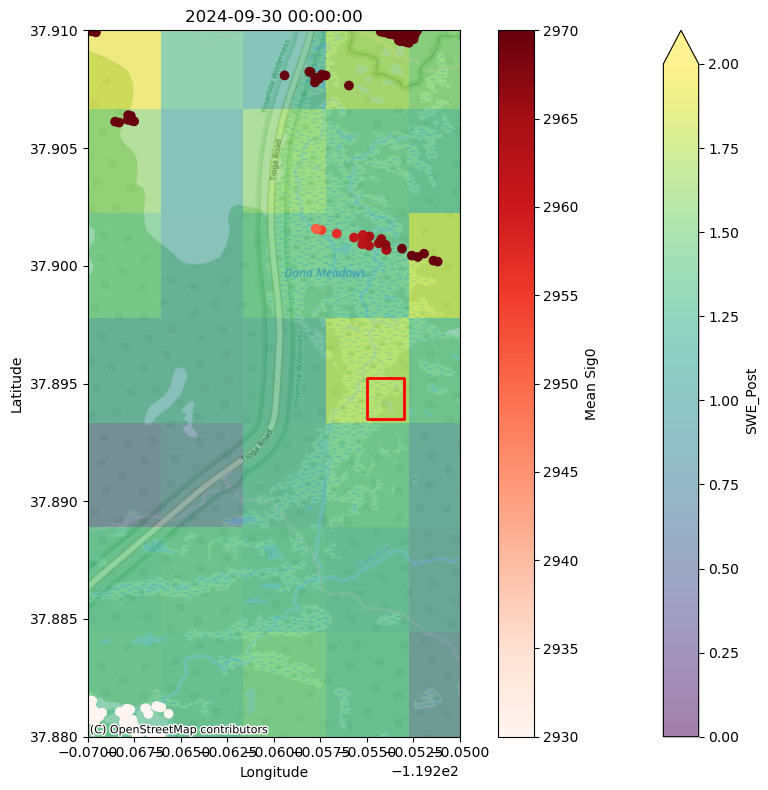

nan
nan
SWOT_L2_HR_PIXC_022_567_221R_20241021T151616_20241021T151627_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

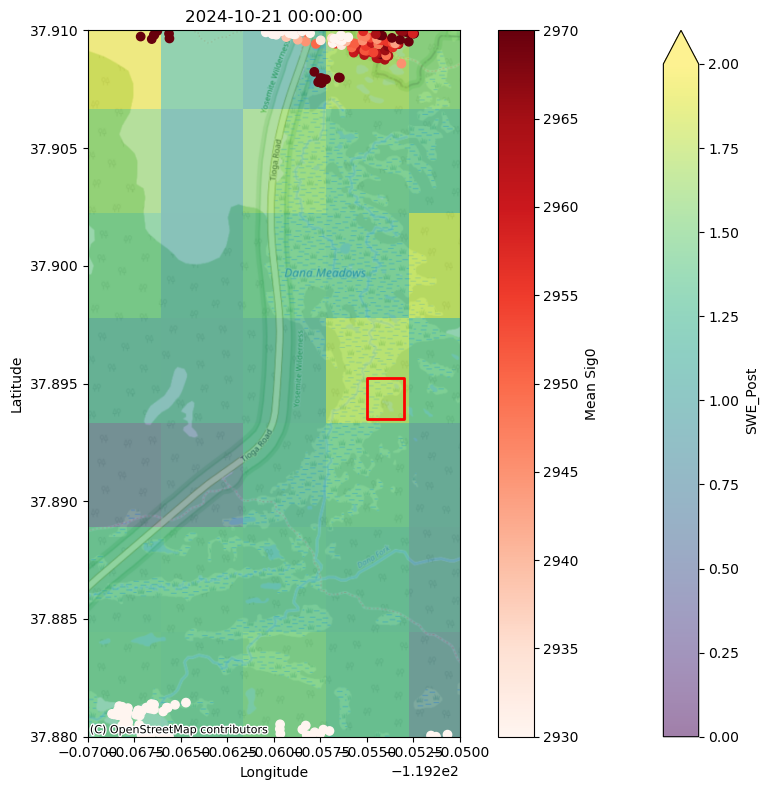

nan
nan
SWOT_L2_HR_PIXC_023_567_221R_20241111T120120_20241111T120131_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

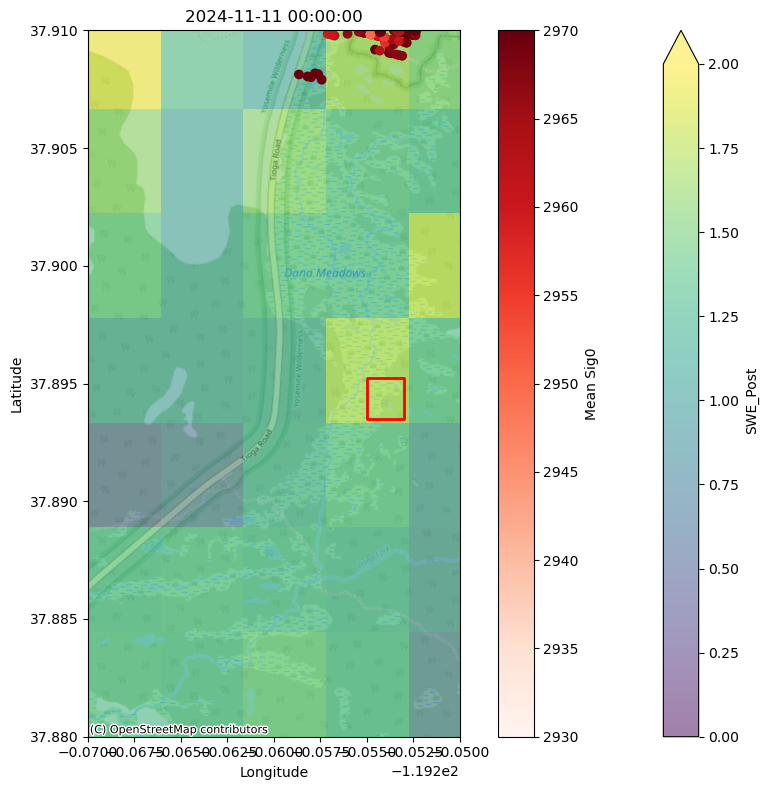

nan
nan
SWOT_L2_HR_PIXC_024_567_221R_20241202T084625_20241202T084636_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

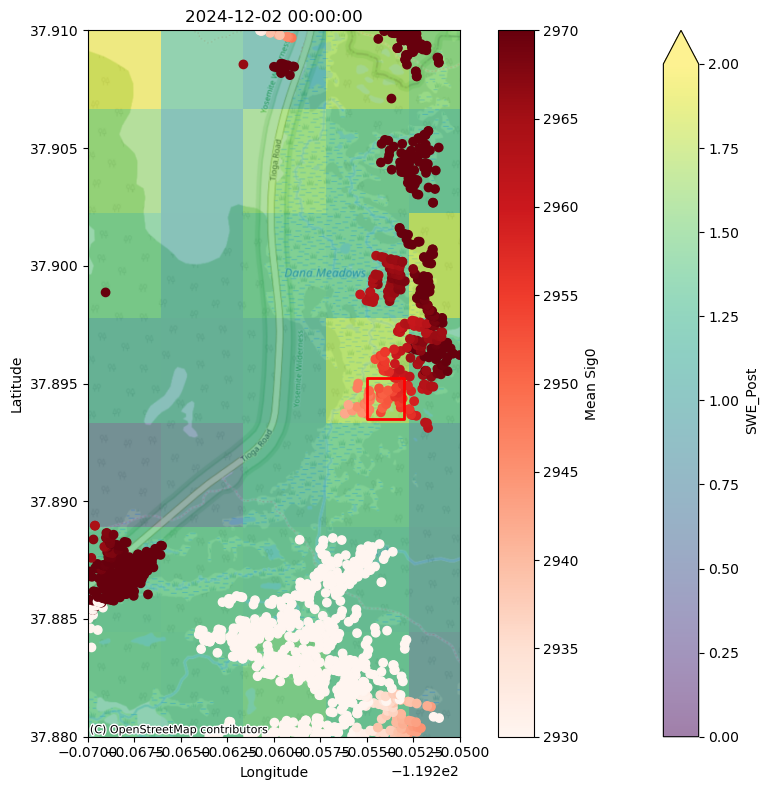

2952.5562
-23.80375809538856
SWOT_L2_HR_PIXC_025_567_221R_20241223T053129_20241223T053140_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

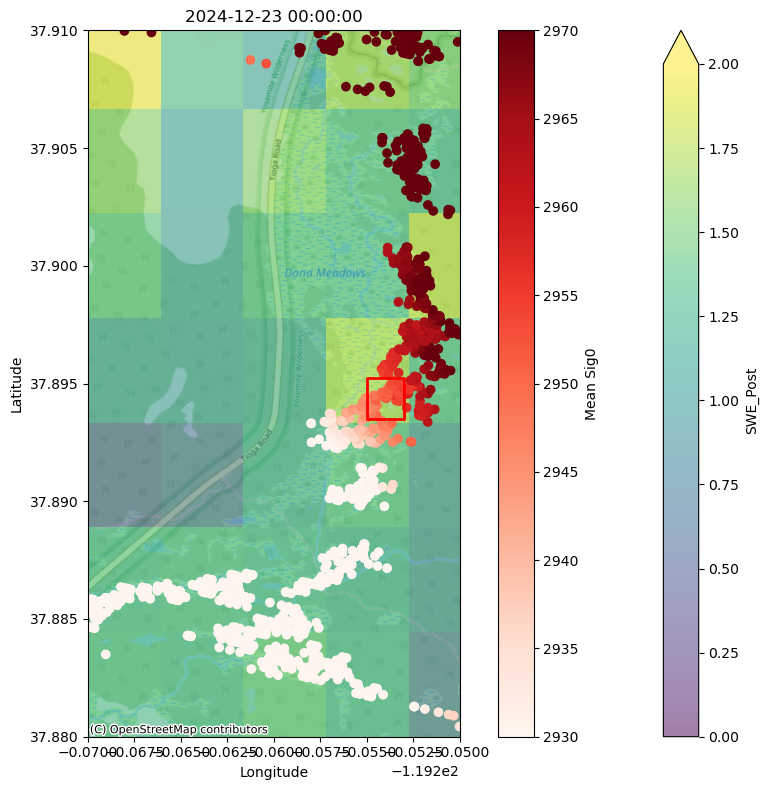

2951.7688
-24.353388362365912
SWOT_L2_HR_PIXC_026_567_221R_20250113T021633_20250113T021644_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

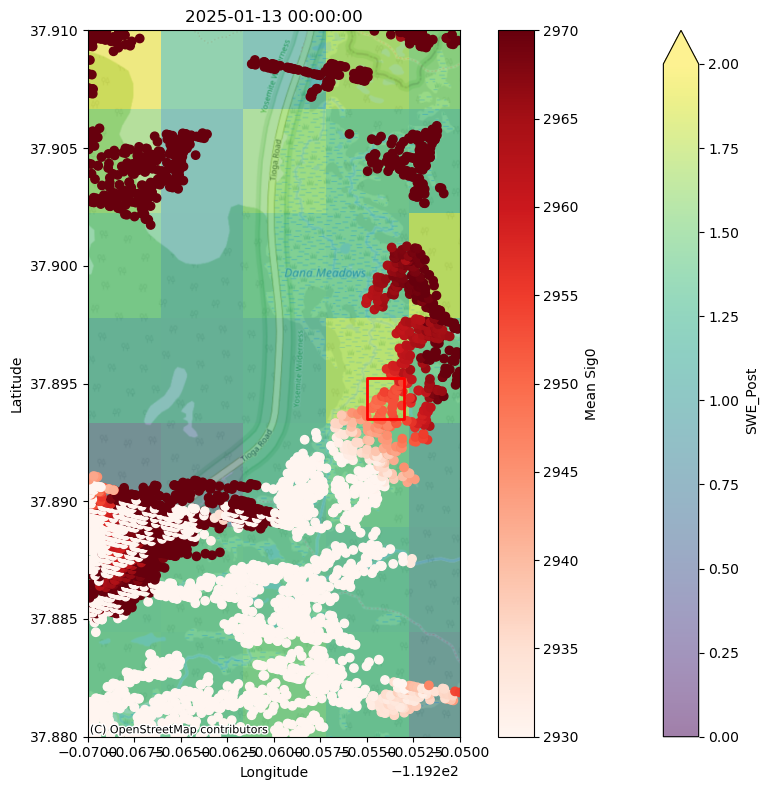

2952.5498
-24.707089746797596
SWOT_L2_HR_PIXC_027_567_221R_20250202T230137_20250202T230148_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

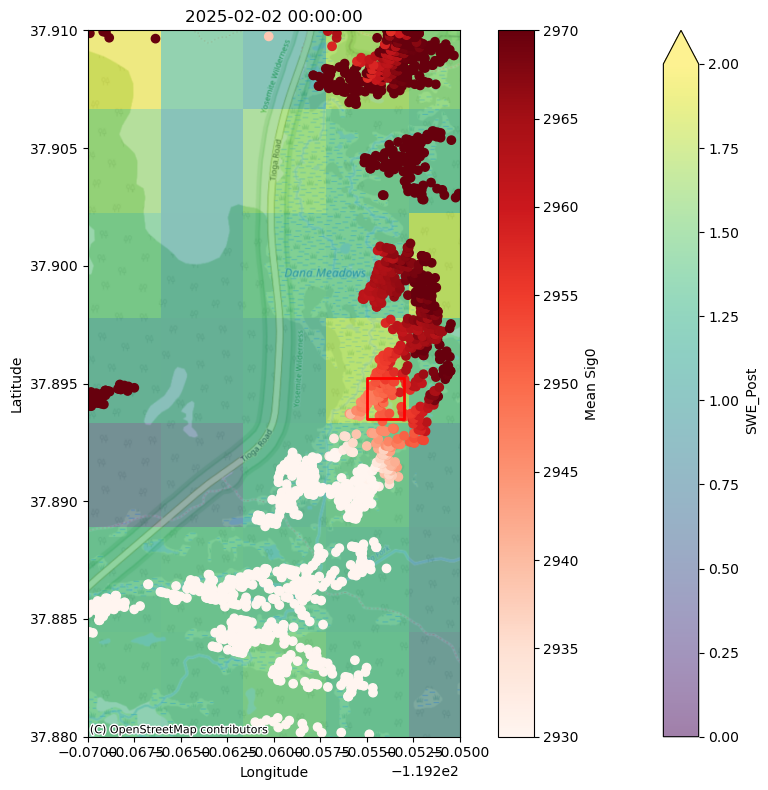

2951.5264
-23.497978045982432
SWOT_L2_HR_PIXC_028_567_221R_20250223T194643_20250223T194654_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

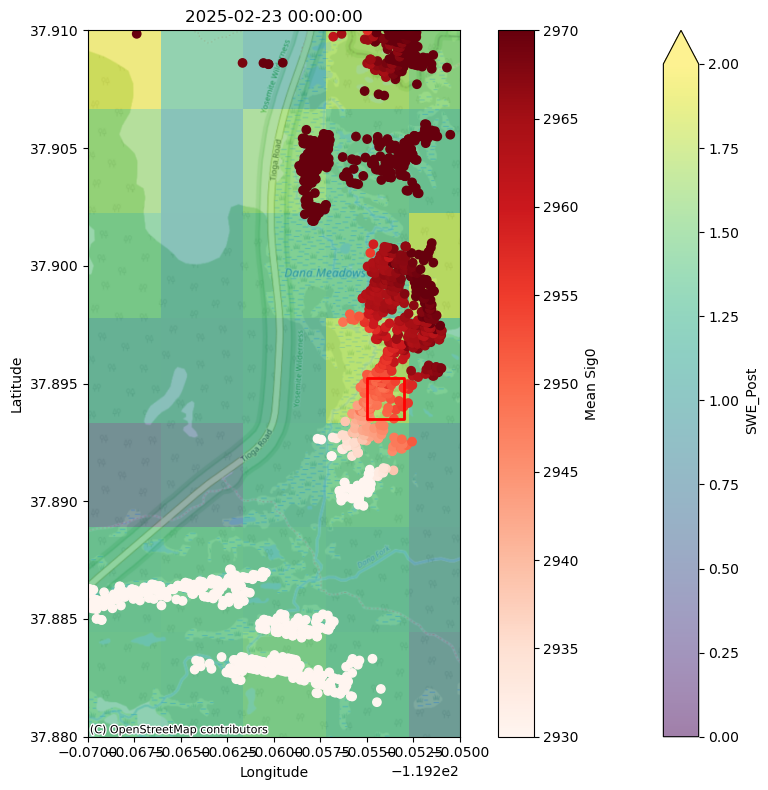

2951.031
-23.46759163059308
SWOT_L2_HR_PIXC_029_567_221R_20250316T163147_20250316T163158_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

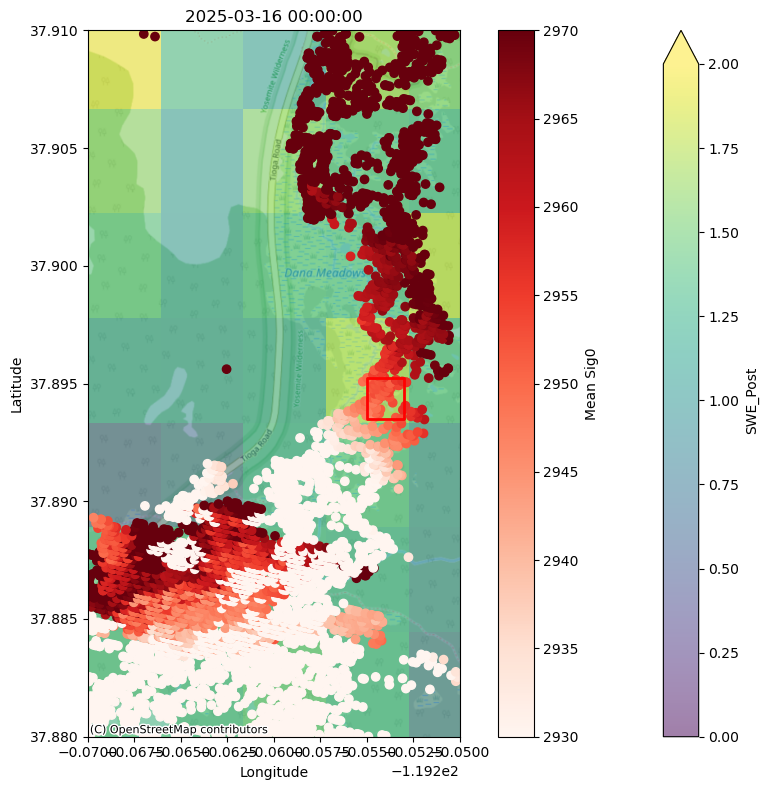

2952.1724
-22.800428239359967
SWOT_L2_HR_PIXC_030_567_221R_20250406T131650_20250406T131701_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

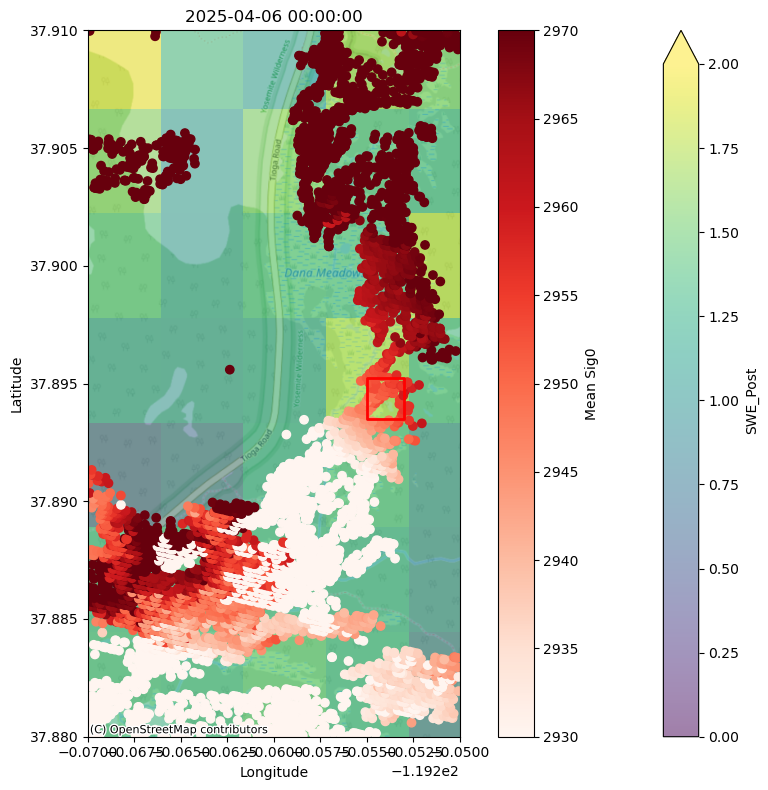

2952.6824
-22.99975225766855
SWOT_L2_HR_PIXC_031_567_221R_20250427T100156_20250427T100207_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

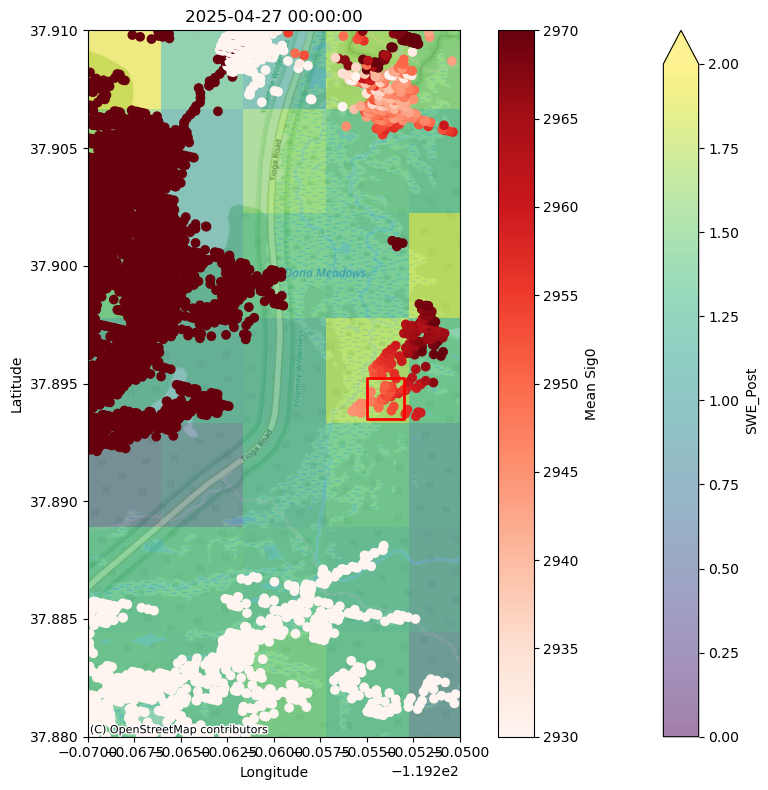

2952.6353
-23.374479747726035
SWOT_L2_HR_PIXC_032_567_221R_20250518T064701_20250518T064712_PID0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

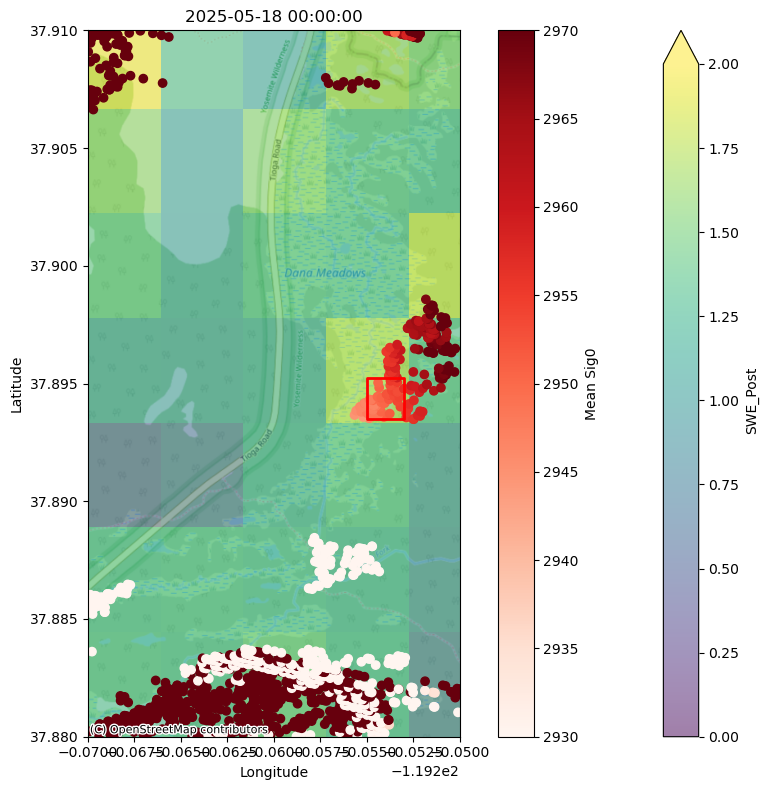

2951.0571
-24.539287444455642
SWOT_L2_HR_PIXC_032_567_221R_20250518T064701_20250518T064712_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

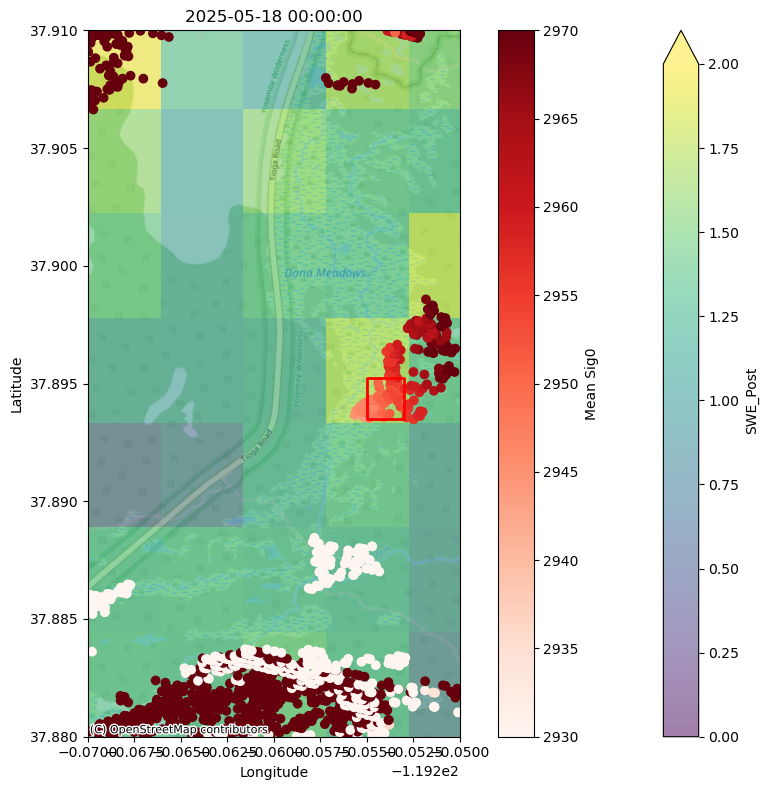

2951.06
-24.55816162541059
SWOT_L2_HR_PIXC_033_567_221R_20250608T033206_20250608T033217_PID0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

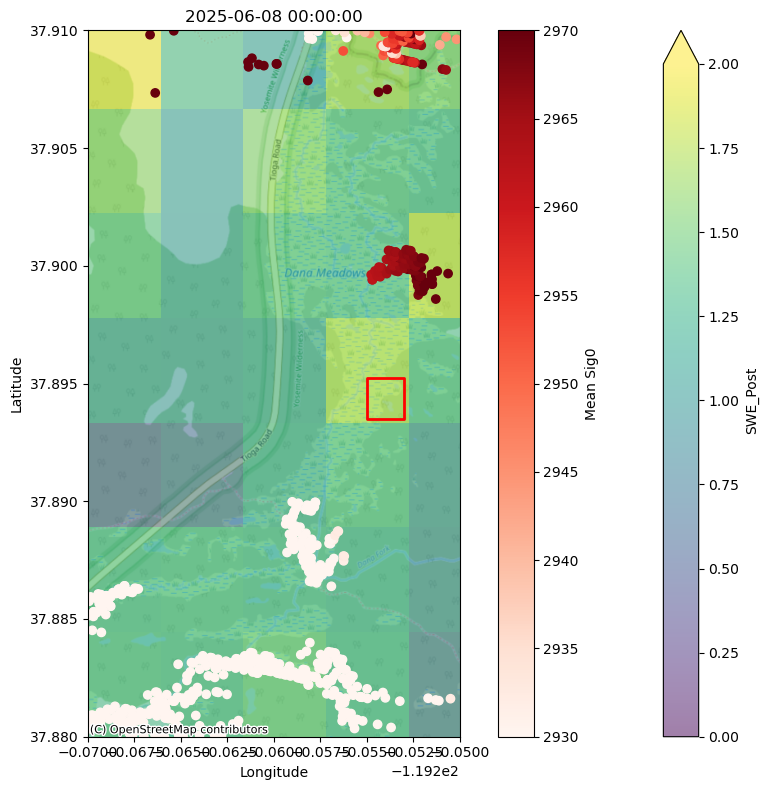

nan
nan
SWOT_L2_HR_PIXC_034_567_221R_20250629T001712_20250629T001723_PID0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

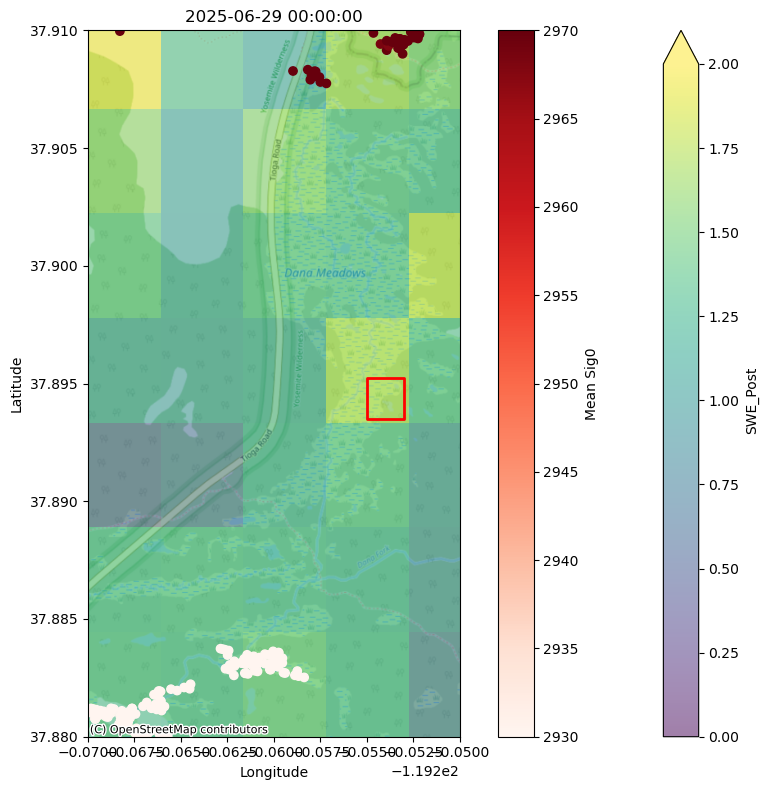

nan
nan
SWOT_L2_HR_PIXC_035_567_221R_20250719T210217_20250719T210228_PID0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [560]:
mean_height_store = []
dem_diff_store = []
day_list = []
granule_list = []
for result in river_results:
    # print(result['umm']['GranuleUR'])
    granule_list.append(result['umm']['GranuleUR'])
# for download_index in range(len(river_results)):

for download_file in river_results[4:-2]:
    # if download_index <= 9:
    #     continue
    granule = download_file['umm']['GranuleUR']
    print(granule)
    if "PIC" in granule and granule.replace("PID", "PGD") in granule_list:
        print(f"Skipping {granule} because PGC version exists")
        continue
    output_dir = './data_downloads/pixc_downloads'
    os.makedirs(output_dir, exist_ok=True)
    # current_pixc_file =earthaccess.download(river_results[download_index], output_dir)
    current_pixc_file =earthaccess.download(download_file, output_dir)
    current_pixc = xr.open_dataset(current_pixc_file[0], group = 'pixel_cloud', engine='h5netcdf').load()

    day = pd.to_datetime(current_pixc.illumination_time.values).normalize().unique()[0]
    day_list.append(day)

    # ds_PIXC_winter.sel(latitude=slice(37.88, 37.91), longitude=slice(-119.27, -119.25))
    lat_min, lat_max = 37.88, 37.91
    lon_min, lon_max = -119.27, -119.25

    mask = (
        (current_pixc['latitude'] >= lat_min) &
        (current_pixc['latitude'] <= lat_max) &
        (current_pixc['longitude'] >= lon_min) &
        (current_pixc['longitude'] <= lon_max)
    )
    subset = current_pixc.isel(points=mask.values)  # or whatever your dim is named

    pc_lats = subset['latitude'].values   # adjust name as needed
    pc_lons = subset['longitude'].values

    dem_at_points = interpolator(np.column_stack([pc_lats, pc_lons]))

    # --- Compute difference ---
    # point cloud height minus DEM height
    height_diff = subset['height'].values - dem_at_points  # adjust variable name

    # --- Optionally attach back to xarray ---
    subset['height_diff'] = ('points', height_diff)  # adjust dim name

    lat_min_tiny, lat_max_tiny = 37.8935, 37.89525
    lon_min_tiny, lon_max_tiny = -119.255, -119.253
    mask = (
        (subset['latitude'] >= lat_min_tiny) &
        (subset['latitude'] <= lat_max_tiny) &
        (subset['longitude'] >= lon_min_tiny) &
        (subset['longitude'] <= lon_max_tiny)
    )
    subset_tiny = subset.isel(points=mask.values)  # or whatever your dim is named

    # From subset tiny, filter out all points where height is less than 2940 or greater than 2960
    mask = (subset_tiny['height'] >= 2930) & (subset_tiny['height'] <= 2970)
    subset_tiny = subset_tiny.isel(points=mask.values)  # or whatever your dim is named
    # Create hexbin on a regular axes first to get the extent
    fig, ax = plt.subplots(figsize=(10, 8))
    test_snow_tile.sel(Day=147, Stats=0).SWE_Post.plot(ax=ax, x='Longitude', y='Latitude', vmin=0, vmax=2, alpha=0.5)

    scatter1 = ax.scatter(x=subset.longitude, y=subset.latitude, c=subset.height, cmap='Reds', vmin=2930, vmax=2970, alpha=1)

    ax.set_xlim(-119.27, -119.25)
    ax.set_ylim(37.88, 37.91)

    dana_box = gpd.GeoDataFrame(
        {'geometry': [shapely.geometry.box(lon_min_tiny, lat_min_tiny, lon_max_tiny, lat_max_tiny)]},
        crs='EPSG:4326'
    )
    dana_box.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2)
    # Add basemap — contextily expects the axes CRS to be Web Mercator (EPSG:3857)
    # but if your data is in WGS84 lon/lat (EPSG:4326), use crs= parameter:
    ctx.add_basemap(
        ax,
        crs='EPSG:4326',           # tell contextily your data is in lon/lat
        source=ctx.providers.OpenStreetMap.Mapnik,  # free, no API key needed
        zoom='auto',
    )

    plt.colorbar(scatter1, ax=ax, label='Mean Sig0')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title(day)
    plt.tight_layout()
    plt.show()
    
    mean_height_store.append(subset_tiny.height.mean().values)
    print(subset_tiny.height.mean().values)
    
    dem_diff_store.append(subset_tiny.height_diff.mean().values)
    print(subset_tiny.height_diff.mean().values)


In [550]:
river_results[4]['umm']['GranuleUR'].replace("PIC", "PGC")

'SWOT_L2_HR_PIXC_005_567_221R_20231101T222952_20231101T223003_PGC0_01'

In [543]:
base_name

'SWOT_L2_HR_PIXC_017_567_221R_20240709T073049_20240709T073100'

In [545]:
unique_granules

{'SWOT_L2_HR_PIXC_001_567_221R_20230810T112934_20230810T112945': 'SWOT_L2_HR_PIXC_001_567_221R_20230810T112934_20230810T112945_PGC0_01',
 'SWOT_L2_HR_PIXC_002_567_221R_20230831T081439_20230831T081450': 'SWOT_L2_HR_PIXC_002_567_221R_20230831T081439_20230831T081450_PGC0_01',
 'SWOT_L2_HR_PIXC_003_567_221R_20230921T045945_20230921T045956': 'SWOT_L2_HR_PIXC_003_567_221R_20230921T045945_20230921T045956_PGC0_01',
 'SWOT_L2_HR_PIXC_004_567_221R_20231012T014447_20231012T014458': 'SWOT_L2_HR_PIXC_004_567_221R_20231012T014447_20231012T014458_PGC0_01',
 'SWOT_L2_HR_PIXC_005_567_221R_20231101T222952_20231101T223003': 'SWOT_L2_HR_PIXC_005_567_221R_20231101T222952_20231101T223003_PGC0_01',
 'SWOT_L2_HR_PIXC_006_567_221R_20231122T191458_20231122T191509': 'SWOT_L2_HR_PIXC_006_567_221R_20231122T191458_20231122T191509_PIC0_01',
 'SWOT_L2_HR_PIXC_007_567_221R_20231213T160001_20231213T160012': 'SWOT_L2_HR_PIXC_007_567_221R_20231213T160001_20231213T160012_PIC0_01',
 'SWOT_L2_HR_PIXC_008_567_221R_20240103T1

In [531]:
river_results

[Collection: {'Version': '2.0', 'ShortName': 'SWOT_L2_HR_PIXC_2.0'}
 Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'BoundingRectangles': [{'WestBoundingCoordinate': -119.557740017855, 'SouthBoundingCoordinate': 37.41412131174079, 'EastBoundingCoordinate': -118.93003457733062, 'NorthBoundingCoordinate': 38.16673466391747}]}, 'Track': {'Cycle': 1, 'Passes': [{'Pass': 567, 'Tiles': ['221R']}]}}}
 Temporal coverage: {'RangeDateTime': {'EndingDateTime': '2023-08-10T11:29:45.970Z', 'BeginningDateTime': '2023-08-10T11:29:34.877Z'}}
 Size(MB): 413.2661199569702
 Data: ['https://archive.swot.podaac.earthdata.nasa.gov/podaac-swot-ops-cumulus-protected/SWOT_L2_HR_PIXC_2.0/SWOT_L2_HR_PIXC_001_567_221R_20230810T112934_20230810T112945_PGC0_01.nc'],
 Collection: {'Version': '2.0', 'ShortName': 'SWOT_L2_HR_PIXC_2.0'}
 Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'BoundingRectangles': [{'WestBoundingCoordinate': -119.55765423186062, 'SouthBoundingCoordinate': 37.41406764849

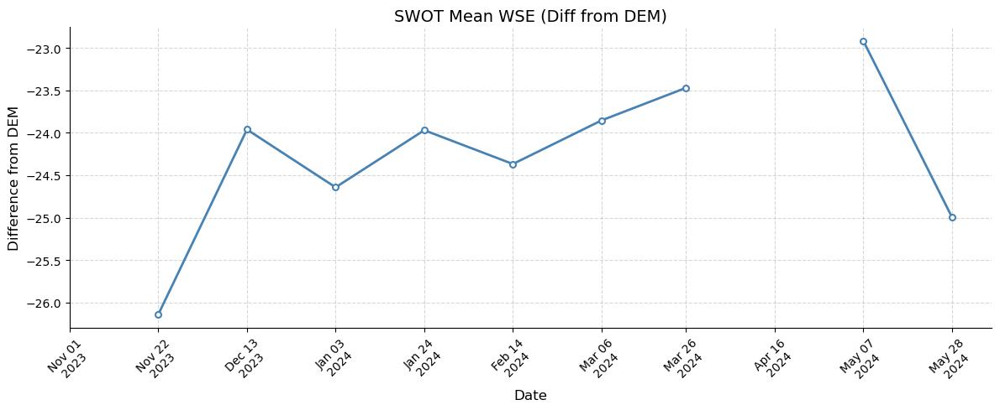

In [576]:
fig, ax = plt.subplots(figsize=(12, 5))

ax.plot(day_list[0:11], dem_diff_store[0:11], 
        color='steelblue', linewidth=2, 
        marker='o', markersize=5, markerfacecolor='white', markeredgewidth=1.5)

# Format x-axis as dates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d\n%Y'))
# ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.set_xticks(day_list[0:11])
# ax.tick_params(axis='x', rotation=45)
fig.autofmt_xdate(rotation=45, ha='center')

# Labels and styling
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Difference from DEM', fontsize=12)
ax.set_title('SWOT Mean WSE (Diff from DEM)', fontsize=14)

ax.grid(True, linestyle='--', alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

In [ ]:
day_list[0:11]

[Timestamp('2023-11-01 00:00:00'),
 Timestamp('2023-11-22 00:00:00'),
 Timestamp('2023-12-13 00:00:00'),
 Timestamp('2024-01-03 00:00:00'),
 Timestamp('2024-01-24 00:00:00'),
 Timestamp('2024-02-14 00:00:00'),
 Timestamp('2024-03-06 00:00:00'),
 Timestamp('2024-03-26 00:00:00'),
 Timestamp('2024-04-16 00:00:00'),
 Timestamp('2024-05-07 00:00:00')]

In [528]:
print(river_results[4:-1])

[Collection: {'Version': '2.0', 'ShortName': 'SWOT_L2_HR_PIXC_2.0'}
Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'BoundingRectangles': [{'WestBoundingCoordinate': -119.55762745420361, 'SouthBoundingCoordinate': 37.4141339741173, 'EastBoundingCoordinate': -118.93202889544904, 'NorthBoundingCoordinate': 38.166684728823896}]}, 'Track': {'Cycle': 5, 'Passes': [{'Pass': 567, 'Tiles': ['221R']}]}}}
Temporal coverage: {'RangeDateTime': {'EndingDateTime': '2023-11-01T22:30:03.911Z', 'BeginningDateTime': '2023-11-01T22:29:52.820Z'}}
Size(MB): 406.3755340576172
Data: ['https://archive.swot.podaac.earthdata.nasa.gov/podaac-swot-ops-cumulus-protected/SWOT_L2_HR_PIXC_2.0/SWOT_L2_HR_PIXC_005_567_221R_20231101T222952_20231101T223003_PGC0_01.nc'], Collection: {'Version': '2.0', 'ShortName': 'SWOT_L2_HR_PIXC_2.0'}
Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'GPolygons': [{'Boundary': {'Points': [{'Latitude': 37.41408285720265, 'Longitude': -119.55767193495916}, {'Latitude